In [1]:
%reset -f

In [2]:
from bs4 import BeautifulSoup
import nbformat
from nbformat.v4 import output_from_msg
from nbconvert.preprocessors import ExecutePreprocessor
import markdown
import os

# Lire le notebook
with open("/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/notebooks/modelisation_MLFLOW.ipynb") as f:
    nb = nbformat.read(f, as_version=4)

# Récupérer le contenu Markdown des cellules
md_content = ""
for cell in nb.cells:
    if cell.cell_type == "markdown":
        md_content += cell.source + "\n"

# Parser le contenu Markdown pour extraire les titres
html_content = markdown.markdown(md_content)
title_tags = ["h1", "h2", "h3", "h4", "h5", "h6"]
titles = [t.text for t in BeautifulSoup(html_content, "html.parser").find_all(title_tags)]

# Afficher les titres et créer un sommaire
#print("Titres :")
#for title in titles:
#    print(title)

print("Sommaire :")
for i, title in enumerate(titles):
    print(f"{i+1}. {title}")

Sommaire :
1. Importation des librairies et du jeu de données
2. Feature engineering
3. Création et séparation des dataframes
4. Preprocessing
5. Filtrage Low Variance
6. Reduction dimensionnelle par ACP
7. Dataframe final
8. Renommage des colonnes
9. DUMMY REGESSOR et Logistic Regression
10. ROC curves
11. Recall curves
12. Matrices de confusion
13. Comparaison de différents modeles
14. Modèles sans hyperparamètres
15. SVC
16. Random Forest Classifier
17. XGB Classifier
18. Light GBM
19. Courbes AUC ROC
20. Matrices de confusion
21. Recherche des hyperparametres
22. Affichage des résultats
23. Courbe AUC ROC
24. Matrices de confusion
25. Calcul du seuil pour le score personnalisé
26. Explication du choix du modele
27. Calcul des Metrics
28. Modèles et leurs métriques
29. Modèles par metriques
30. Feature importance des différents modèles
31. Sauvegarde des dataframe
32. Sauvegarde des modeles
33. Sauvegarde du modele candidat pré-entrainé
34. SPECIFICITE METIER
35. Comment fonctionne 

## Importation des librairies et du jeu de données

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder, normalize
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, mean_absolute_error
from sklearn.decomposition import PCA

import outils_analyses

import xgboost as xgb

In [4]:
import multiprocessing

# Obtenir le nombre de cœurs logiques
num_cores = multiprocessing.cpu_count()

print("Nombre de cœurs logiques :", num_cores)

Nombre de cœurs logiques : 12


In [5]:
#Définir le nombre de threads pour OpenMP"
os.environ['OMP_NUM_THREADS'] = '8'  

In [6]:
#Reglage de l'affichage de données
pd.set_option('display.max_row',250)
pd.set_option('display.max_column',300)
pd.set_option('display.precision', 5)

In [7]:
def results (var):
        print(var.best_params_)
        pred = var.predict(X_train)
        print('Best score: ', var.best_score_)
        print('Test Accuracy: ', var.score(X_train, y_train))

       # mse = mean_squared_error(X_train, y_train)
       # print('MSE: %2.3f' % mse)

def scaling (dataset):
    scaler = StandardScaler()

    # Séparation des variables catégorielles et numériques
    numerical_features = dataset.select_dtypes(exclude='object')
    numerical_features = numerical_features.fillna(0)
    xscale = scaler.fit_transform(numerical_features)

    categorical_features = dataset.select_dtypes(include='object')


    encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
    X_encoded = encoder.fit_transform(categorical_features)

    # création du nom des features catégoriques
    categorical_columns = [f'{col}_{cat}' for i, col in enumerate(categorical_features.columns)
                        for cat in encoder.categories_[i]]

   #Nous créons un dataframe avec les variables catégoriques auquel nous joignons les features numériques

    one_hot_features = pd.DataFrame(X_encoded,
                                    columns=categorical_columns)
    X = numerical_features.join(one_hot_features)

    return X


# fonction qui donne le résultat des métrics pour chaque modéles

def test(models, X_train, X_test, y_train, y_test):
    results = []
    for i, model in enumerate(models):

        models[model].fit(X_train, y_train)
        y_pred = models[model].predict(X_test)

        r2_predict = r2_score(y_test, y_pred)
        MAE = mean_absolute_error(y_test, y_pred)
        MSE = mean_squared_error(y_test, y_pred)
        RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
        errors = abs(y_pred - y_test)

        results.append([r2_predict,MAE,MSE,RMSE,np.mean(errors)])

    return pd.DataFrame(results, columns=["R2 Score",'MAE','MSE','RMSE','Erreur moyenne'], index=models.keys())


def models_viz (df):
    plt.subplots(figsize=(10, 10))

    for index, column in enumerate(df.columns):
        plt.subplot(3, 2, index+1)
        sns.barplot(x=df.index, y=column, data=df)
    plt.tight_layout()
    plt.show()

In [8]:
def convert_float64_to_float16_int8(dataframes):
    for df_name in dataframes:
        dataframe = dataframes[df_name]
        
        if isinstance(dataframe, pd.DataFrame):
            # Convertir les colonnes float64 en float16
            float_cols = dataframe.select_dtypes(include=['float64']).columns
            for col in float_cols:
                dataframe[col] = dataframe[col].astype('float16')
            
            # Convertir les colonnes int64 en int8
            int_cols = dataframe.select_dtypes(include=['int64']).columns
            for col in int_cols:
                dataframe[col] = dataframe[col].astype('int8')
    
    return dataframes


In [9]:
#Importation du jeu de données
missing_values = ["n/a", "na", "--","nan","NaN"]

# Chargement du fichier parquet dans un DataFrame
data = pd.read_parquet('/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/datasets/data.parquet')


In [10]:
print(data.shape)
data.head()

(307508, 27)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,AMT_CREDIT_SUM,CREDIT_TYPE,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT,AMT_PAYMENT,NAME_CONTRACT_TYPE_PREV,AMT_CREDIT_PREV
0,100002,1,Cash_loans,M,N,Y,0.0,24704.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,26.0,Laborers,1.0,Business_Entity_Type_3,0.08301,0.26294,0.13940,0,40770.0,Credit_card,16.0,9250.0,9250.0,Consumer_loans,0.0
1,100003,0,Cash_loans,F,N,N,0.0,35712.0,State_servant,Higher_education,Married,House_apartment,46.0,Core_staff,2.0,School,0.31128,0.62207,0.00000,0,22240.0,Consumer_credit,2.0,0.0,0.0,Cash_loans,0.0
2,100004,0,Revolving_loans,M,Y,Y,0.0,6752.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,52.0,Laborers,1.0,Government,0.00000,0.55615,0.72949,0,0.0,Consumer_credit,2.0,5356.0,5356.0,Consumer_loans,20110.0
3,100006,0,Cash_loans,F,N,Y,0.0,29680.0,Working,Secondary__secondary_special,Civil_marriage,House_apartment,52.0,Laborers,2.0,Business_Entity_Type_3,0.00000,0.65039,0.00000,0,0.0,autre,3.0,29020.0,29020.0,Cash_loans,0.0
4,100007,0,Cash_loans,M,N,Y,0.0,21872.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,55.0,Core_staff,1.0,Religion,0.00000,0.32275,0.00000,0,0.0,Consumer_credit,4.0,1834.0,1834.0,Cash_loans,0.0


In [11]:
df = data.copy()

## Feature engineering

In [12]:
# Convertir la colonne 'NAME_CONTRACT_TYPE_PREV' en type 'object'
data['NAME_CONTRACT_TYPE_PREV'] = data['NAME_CONTRACT_TYPE_PREV'].astype('object')

# Afficher le DataFrame 'data_final' après la conversion
print(data.dtypes)

SK_ID_CURR                   int64
TARGET                        int8
NAME_CONTRACT_TYPE          object
CODE_GENDER                 object
FLAG_OWN_CAR                object
FLAG_OWN_REALTY             object
CNT_CHILDREN               float32
AMT_ANNUITY                float32
NAME_INCOME_TYPE            object
NAME_EDUCATION_TYPE         object
NAME_FAMILY_STATUS          object
NAME_HOUSING_TYPE           object
AGE                        float32
OCCUPATION_TYPE             object
CNT_FAM_MEMBERS            float32
ORGANIZATION_TYPE           object
EXT_SOURCE_1               float32
EXT_SOURCE_2               float32
EXT_SOURCE_3               float32
CREDIT_ACTIVE                 int8
AMT_CREDIT_SUM             float32
CREDIT_TYPE                 object
NUM_INSTALMENT_NUMBER      float32
AMT_INSTALMENT             float32
AMT_PAYMENT                float32
NAME_CONTRACT_TYPE_PREV     object
AMT_CREDIT_PREV            float32
dtype: object


In [13]:
data.columns = data.columns.str.replace('[^a-zA-Z0-9_]', '', regex=True)

In [14]:
missing_value_counts = data.isna().sum()
print(missing_value_counts)

SK_ID_CURR                 0
TARGET                     0
NAME_CONTRACT_TYPE         0
CODE_GENDER                0
FLAG_OWN_CAR               0
FLAG_OWN_REALTY            0
CNT_CHILDREN               0
AMT_ANNUITY                0
NAME_INCOME_TYPE           0
NAME_EDUCATION_TYPE        0
NAME_FAMILY_STATUS         0
NAME_HOUSING_TYPE          0
AGE                        0
OCCUPATION_TYPE            0
CNT_FAM_MEMBERS            0
ORGANIZATION_TYPE          0
EXT_SOURCE_1               0
EXT_SOURCE_2               0
EXT_SOURCE_3               0
CREDIT_ACTIVE              0
AMT_CREDIT_SUM             0
CREDIT_TYPE                0
NUM_INSTALMENT_NUMBER      0
AMT_INSTALMENT             0
AMT_PAYMENT                0
NAME_CONTRACT_TYPE_PREV    0
AMT_CREDIT_PREV            0
dtype: int64


## Création et séparation des dataframes

In [15]:
# Définir une graine aléatoire pour la reproductibilité
random_seed = 42

In [16]:
# Séparer les variables prédictives (features) et la variable cible (target)
X = data.drop(['TARGET', 'SK_ID_CURR'], axis=1)
y = data['TARGET']  # Sélectionner uniquement la colonne 'TARGET' pour obtenir la variable cible

In [17]:
df_wk = X

In [18]:
df_wk.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,AMT_CREDIT_SUM,CREDIT_TYPE,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT,AMT_PAYMENT,NAME_CONTRACT_TYPE_PREV,AMT_CREDIT_PREV
0,Cash_loans,M,N,Y,0.0,24704.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,26.0,Laborers,1.0,Business_Entity_Type_3,0.08301,0.26294,0.13940,0,40770.0,Credit_card,16.0,9250.0,9250.0,Consumer_loans,0.0
1,Cash_loans,F,N,N,0.0,35712.0,State_servant,Higher_education,Married,House_apartment,46.0,Core_staff,2.0,School,0.31128,0.62207,0.00000,0,22240.0,Consumer_credit,2.0,0.0,0.0,Cash_loans,0.0
2,Revolving_loans,M,Y,Y,0.0,6752.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,52.0,Laborers,1.0,Government,0.00000,0.55615,0.72949,0,0.0,Consumer_credit,2.0,5356.0,5356.0,Consumer_loans,20110.0
3,Cash_loans,F,N,Y,0.0,29680.0,Working,Secondary__secondary_special,Civil_marriage,House_apartment,52.0,Laborers,2.0,Business_Entity_Type_3,0.00000,0.65039,0.00000,0,0.0,autre,3.0,29020.0,29020.0,Cash_loans,0.0
4,Cash_loans,M,N,Y,0.0,21872.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,55.0,Core_staff,1.0,Religion,0.00000,0.32275,0.00000,0,0.0,Consumer_credit,4.0,1834.0,1834.0,Cash_loans,0.0


## Preprocessing

In [19]:
# Appliquer une mise à l'échelle aux variables prédictives
df_wk = scaling(df_wk)

In [20]:
df_wk.head()

,CNT_CHILDREN,AMT_ANNUITY,AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,AMT_CREDIT_SUM,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT,AMT_PAYMENT,AMT_CREDIT_PREV,NAME_CONTRACT_TYPE_Cash_loans,NAME_CONTRACT_TYPE_Revolving_loans,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial_associate,NAME_INCOME_TYPE_Maternity_leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State_servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic_degree,NAME_EDUCATION_TYPE_Higher_education,NAME_EDUCATION_TYPE_Incomplete_higher,NAME_EDUCATION_TYPE_Lower_secondary,NAME_EDUCATION_TYPE_Secondary__secondary_special,NAME_FAMILY_STATUS_Civil_marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single_not_married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op_apartment,NAME_HOUSING_TYPE_House_apartment,NAME_HOUSING_TYPE_Municipal_apartment,NAME_HOUSING_TYPE_Office_apartment,NAME_HOUSING_TYPE_Rented_apartment,NAME_HOUSING_TYPE_With_parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning_staff,OCCUPATION_TYPE_Cooking_staff,OCCUPATION_TYPE_Core_staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR_staff,OCCUPATION_TYPE_High_skill_tech_staff,OCCUPATION_TYPE_IT_staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill_Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine_staff,OCCUPATION_TYPE_Private_service_staff,OCCUPATION_TYPE_Realty_agents,OCCUPATION_TYPE_Sales_staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security_staff,OCCUPATION_TYPE_Waiters_barmen_staff,OCCUPATION_TYPE_autre,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business_Entity_Type_1,ORGANIZATION_TYPE_Business_Entity_Type_2,ORGANIZATION_TYPE_Business_Entity_Type_3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry:_type_1,ORGANIZATION_TYPE_Industry:_type_10,ORGANIZATION_TYPE_Industry:_type_11,ORGANIZATION_TYPE_Industry:_type_12,ORGANIZATION_TYPE_Industry:_type_13,ORGANIZATION_TYPE_Industry:_type_2,ORGANIZATION_TYPE_Industry:_type_3,ORGANIZATION_TYPE_Industry:_type_4,ORGANIZATION_TYPE_Industry:_type_5,ORGANIZATION_TYPE_Industry:_type_6,ORGANIZATION_TYPE_Industry:_type_7,ORGANIZATION_TYPE_Industry:_type_8,ORGANIZATION_TYPE_Industry:_type_9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal_Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security_Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade:_type_1,ORGANIZATION_TYPE_Trade:_type_2,ORGANIZATION_TYPE_Trade:_type_3,ORGANIZATION_TYPE_Trade:_type_4,ORGANIZATION_TYPE_Trade:_type_5,ORGANIZATION_TYPE_Trade:_type_6,ORGANIZATION_TYPE_Trade:_type_7,ORGANIZATION_TYPE_Transport:_type_1,ORGANIZATION_TYPE_Transport:_type_2,ORGANIZATION_TYPE_Transport:_type_3,ORGANIZATION_TYPE_Transport:_type_4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA,CREDIT_TYPE_Another_type_of_loan,CREDIT_TYPE_Car_loan,CREDIT_TYPE_Consumer_credit,CREDIT_TYPE_Credit_card,CREDIT_TYPE_Loan_for_business_development,CREDIT_TYPE_Loan_for_the_purchase_of_equipment,CREDIT_TYPE_Loan_for_working_capital_replenishment,CREDIT_TYPE_Microloan,CREDIT_TYPE_Mortgage,CREDIT_TYPE_Real_estate_loan,CREDIT_TYPE_Unknown_type_of_loan,CREDIT_TYPE_autre,NAME_CONTRACT_TYPE_PREV_Cash_loans,NAME_CONTRACT_TYPE_PREV_Consumer_loans,NAME_CONTRACT_TYPE_

In [21]:
df_wk.shape

(307508, 141)

In [22]:
# Nous remplacons les Nan par 0
df_wk = df_wk.fillna('0')

## Filtrage Low Variance

In [23]:
display(df_wk.T)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,...,307358,307359,307360,307361,307362,307363,307364,307365,307366,307367,307368,307369,307370,307371,307372,307373,307374,307375,307376,307377,307378,307379,307380,307381,307382,307383,307384,307385,307386,307387,307388,307389,307390,307391,307392,307393,307394,307395,307396,307397,307398,307399,307400,307401,307402,307403,307404,307405,307406,307407,307408,307409,307410,307411,307412,307413,307414,307415,307416,307417,307418,307419,307420,307421,307422,307423,307424,307425,307426,307427,307428,307429,307430,307431,307432,307433,307434,307435,307436,307437,307438,307439,307440,307441,307442,307443,307444,307445,307446,307447,307448,307449,307450,307451,307452,307453,307454,307455,307456,307457,307458,307459,307460,307461,307462,307463,307464,307465,307466,307467,307468,307469,307470,307471,307472,307473,307474,307475,307476,307477,307478,307479,307480,307481,307482,307483,307484,307485,307486,307487,307488,307489,307490,307491,307492,307493,307494,307495,307496,307497,307498,307499,307500,307501,307502,307503,307504,307505,307506,307507
CNT_CHILDREN,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,1.00000,1.00000,0.00000,2.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,2.00000,0.00000,2.00000,1.00000,1.00000,1.00000,0.00000,0.00000,1.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,1.00000,0.00000,0.00000,0.00000,3.00000,3.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,2.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,3.00000,0.00000,0.00000,2.00000,1.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,1.00000,2.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,2.00000,0.00000,3.0,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,2.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,1.00000,2.00000,1.00000,0.00000,1.00000,0.00000,2.00000,0.00000,0.00000,1.00000,1.00000,3.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,2.00000,1.00000,1.00000,2.00000,1.00000,2.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,3.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
AMT_ANNUITY,24704.00000,35712.00000,6752.0

In [24]:
df_wk.nunique(axis=0)

CNT_CHILDREN                                             15
AMT_ANNUITY                                            4027
AGE                                                      49
CNT_FAM_MEMBERS                                          18
EXT_SOURCE_1                                           4431
EXT_SOURCE_2                                           6889
EXT_SOURCE_3                                            815
CREDIT_ACTIVE                                             2
AMT_CREDIT_SUM                                         2875
NUM_INSTALMENT_NUMBER                                   191
AMT_INSTALMENT                                        10774
AMT_PAYMENT                                           11352
AMT_CREDIT_PREV                                        2630
NAME_CONTRACT_TYPE_Cash_loans                             2
NAME_CONTRACT_TYPE_Revolving_loans                        2
CODE_GENDER_F                                             2
CODE_GENDER_M                           

In [25]:
df_wk.isnull().sum()/len(df_wk)*100

CNT_CHILDREN                                          0.0
AMT_ANNUITY                                           0.0
AGE                                                   0.0
CNT_FAM_MEMBERS                                       0.0
EXT_SOURCE_1                                          0.0
EXT_SOURCE_2                                          0.0
EXT_SOURCE_3                                          0.0
CREDIT_ACTIVE                                         0.0
AMT_CREDIT_SUM                                        0.0
NUM_INSTALMENT_NUMBER                                 0.0
AMT_INSTALMENT                                        0.0
AMT_PAYMENT                                           0.0
AMT_CREDIT_PREV                                       0.0
NAME_CONTRACT_TYPE_Cash_loans                         0.0
NAME_CONTRACT_TYPE_Revolving_loans                    0.0
CODE_GENDER_F                                         0.0
CODE_GENDER_M                                         0.0
CODE_GENDER_XN

In [26]:
# Normalisation du dataframe
normalize = normalize(df_wk)

In [27]:
# Scalling des données
data_scaled = pd.DataFrame(normalize)
data_scaled.var()

0      1.57218e-06
1      7.31199e-02
2      4.10939e-03
3      1.30771e-05
4      4.78859e-07
5      9.95459e-07
6      5.65639e-07
7      6.99432e-07
8      9.47901e-02
9      9.50545e-05
10     4.30600e-02
11     4.28790e-02
12     1.16642e-01
13     1.57668e-06
14     9.09947e-07
15     1.24557e-06
16     1.24239e-06
17     2.12133e-14
18     1.14327e-06
19     1.34475e-06
20     9.56587e-07
21     1.53074e-06
22     1.00862e-08
23     1.43602e-06
24     8.69901e-10
25     1.91927e-07
26     1.84018e-07
27     7.29636e-14
28     1.42439e-13
29     6.67588e-07
30     3.77535e-09
31     1.89668e-06
32     7.04681e-08
33     3.18759e-09
34     5.13742e-07
35     1.84695e-07
36     1.69136e-06
37     9.57495e-08
38     4.95238e-07
39     6.65468e-15
40     2.08915e-08
41     1.29779e-08
42     2.27676e-06
43     5.08631e-08
44     2.56361e-08
45     2.76499e-08
46     8.83096e-08
47     1.73897e-07
48     3.88897e-09
49     1.17516e-09
50     2.91143e-07
51     4.75431e-08
52     1.525

In [28]:
# Calcul de la variance des données dans data_scaled
variance = data_scaled.var()
columns = df_wk.columns

In [29]:
# Création d'une liste vide
variable = []

# Parcours de chaque élément de la liste "variance"
for i in range(0, len(variance)):
    # Vérification si la variance de la variable dépasse le seuil défini
    if variance[i] >= 0.00000099:  # Définition du seuil
        # Si la variance est supérieure ou égale au seuil, ajouter le nom de la variable correspondante à la liste "variable"
        variable.append(columns[i])


In [30]:
"Convertir la liste en une série pandas."
variable_series = pd.Series(variable)

"Obtenir le décompte de chaque valeur unique dans la série."
shape = variable_series.shape

print(shape)

(21,)


In [31]:
variable

['CNT_CHILDREN',
 'AMT_ANNUITY',
 'AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'AMT_CREDIT_SUM',
 'NUM_INSTALMENT_NUMBER',
 'AMT_INSTALMENT',
 'AMT_PAYMENT',
 'AMT_CREDIT_PREV',
 'NAME_CONTRACT_TYPE_Cash_loans',
 'CODE_GENDER_F',
 'CODE_GENDER_M',
 'FLAG_OWN_CAR_N',
 'FLAG_OWN_CAR_Y',
 'FLAG_OWN_REALTY_Y',
 'NAME_INCOME_TYPE_Commercial_associate',
 'NAME_EDUCATION_TYPE_Higher_education',
 'NAME_FAMILY_STATUS_Married',
 'NAME_HOUSING_TYPE_House_apartment',
 'NAME_CONTRACT_TYPE_PREV_autre']

In [32]:
# Afficher les noms de colonnes actuels dans le DataFrame
print("Colonnes dans df_wk:", df_wk.columns)

# Afficher les noms de colonnes que vous essayez de sélectionner
print("Colonnes à sélectionner:", variable)

# Trouver les colonnes manquantes
missing_cols = [col for col in variable if col not in df_wk.columns]
print("Colonnes manquantes:", missing_cols)


Colonnes dans df_wk: Index(['CNT_CHILDREN', 'AMT_ANNUITY', 'AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ACTIVE', 'AMT_CREDIT_SUM',
       'NUM_INSTALMENT_NUMBER',
       ...
       'CREDIT_TYPE_Microloan', 'CREDIT_TYPE_Mortgage',
       'CREDIT_TYPE_Real_estate_loan', 'CREDIT_TYPE_Unknown_type_of_loan',
       'CREDIT_TYPE_autre', 'NAME_CONTRACT_TYPE_PREV_Cash_loans',
       'NAME_CONTRACT_TYPE_PREV_Consumer_loans',
       'NAME_CONTRACT_TYPE_PREV_Revolving_loans',
       'NAME_CONTRACT_TYPE_PREV_XNA', 'NAME_CONTRACT_TYPE_PREV_autre'],
      dtype='object', length=141)
Colonnes à sélectionner: ['CNT_CHILDREN', 'AMT_ANNUITY', 'AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'AMT_CREDIT_SUM', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT', 'AMT_PAYMENT', 'AMT_CREDIT_PREV', 'NAME_CONTRACT_TYPE_Cash_loans', 'CODE_GENDER_F', 'CODE_GENDER_M', 'FLAG_OWN_CAR_N', 'FLAG_OWN_CAR_Y', 'FLAG_OWN_REALTY_Y', 'NAME_INCOME_TYPE_Commercial_associate', 'NAME_EDUCATION_TYPE_

In [33]:
# Ajouter la colonne Ext_Sources à la liste variable 
variable.append('EXT_SOURCE_1'),
variable.append('EXT_SOURCE_3')

# Supprimer toutes les colonnes qui ne sont pas dans la liste variable
df_wk = df_wk.loc[:, variable]

# Vérifier le résultat
print(df_wk.head())

   CNT_CHILDREN  AMT_ANNUITY   AGE  CNT_FAM_MEMBERS  EXT_SOURCE_2  \
0           0.0      24704.0  26.0              1.0       0.26294   
1           0.0      35712.0  46.0              2.0       0.62207   
2           0.0       6752.0  52.0              1.0       0.55615   
3           0.0      29680.0  52.0              2.0       0.65039   
4           0.0      21872.0  55.0              1.0       0.32275   

   AMT_CREDIT_SUM  NUM_INSTALMENT_NUMBER  AMT_INSTALMENT  AMT_PAYMENT  \
0         40770.0                   16.0          9250.0       9250.0   
1         22240.0                    2.0             0.0          0.0   
2             0.0                    2.0          5356.0       5356.0   
3             0.0                    3.0         29020.0      29020.0   
4             0.0                    4.0          1834.0       1834.0   

   AMT_CREDIT_PREV  NAME_CONTRACT_TYPE_Cash_loans  CODE_GENDER_F  \
0              0.0                            1.0            0.0   
1         

In [34]:
df_wk.head()

,CNT_CHILDREN,AMT_ANNUITY,AGE,CNT_FAM_MEMBERS,EXT_SOURCE_2,AMT_CREDIT_SUM,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT,AMT_PAYMENT,AMT_CREDIT_PREV,NAME_CONTRACT_TYPE_Cash_loans,CODE_GENDER_F,CODE_GENDER_M,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Commercial_associate,NAME_EDUCATION_TYPE_Higher_education,NAME_FAMILY_STATUS_Married,NAME_HOUSING_TYPE_House_apartment,NAME_CONTRACT_TYPE_PREV_autre,EXT_SOURCE_1,EXT_SOURCE_3
0,0.0,24704.0,26.0,1.0,0.26294,40770.0,16.0,9250.0,9250.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.08301,0.13940
1,0.0,35712.0,46.0,2.0,0.62207,22240.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.31128,0.00000
2,0.0,6752.0,52.0,1.0,0.55615,0.0,2.0,5356.0,5356.0,20110.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.00000,0.72949
3,0.0,29680.0,52.0,2.0,0.65039,0.0,3.0,29020.0,29020.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.00000,0.00000
4,0.0,21872.0,55.0,1.0,0.32275,0.0,4.0,1834.0,1834.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.00000,0.00000


## Reduction dimensionnelle par ACP 

In [35]:
n_components = 8

PCA ratio variance [0.13043174 0.09315681 0.08876163 0.06786236 0.06391916 0.05661508
 0.05304383 0.0493863 ]


array([13., 22., 31., 38., 44., 50., 55., 60.])

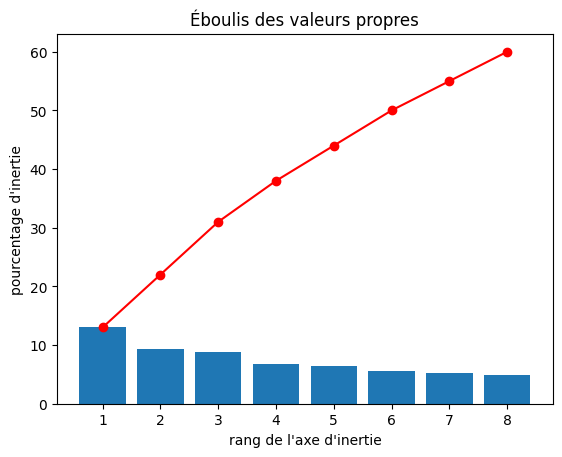

Calcul des composants                                             F1       F2       F3       F4  \
CNT_CHILDREN                           0.25461 -0.08383  0.52688  0.14322   
AMT_ANNUITY                            0.11732  0.17395  0.02690 -0.22504   
AGE                                   -0.21655  0.14317 -0.19290 -0.18471   
CNT_FAM_MEMBERS                        0.30203 -0.04865  0.55255  0.09066   
EXT_SOURCE_2                           0.02230  0.09731  0.00850 -0.35024   
AMT_CREDIT_SUM                        -0.01317 -0.04406  0.03766  0.03047   
NUM_INSTALMENT_NUMBER                 -0.00799 -0.06764 -0.00213 -0.10411   
AMT_INSTALMENT                         0.00967  0.63698  0.04132  0.15896   
AMT_PAYMENT                            0.00826  0.63458  0.04058  0.15976   
AMT_CREDIT_PREV                        0.01517 -0.13039  0.03442  0.13587   
NAME_CONTRACT_TYPE_Cash_loans          0.00199  0.06694 -0.03102 -0.05703   
CODE_GENDER_F                         -0.40945  0.0350

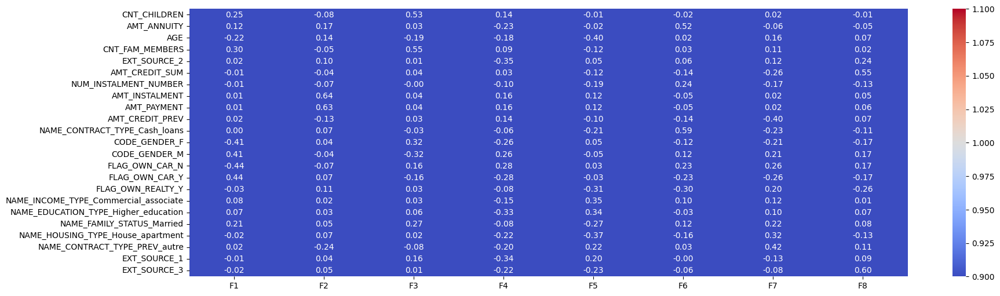

In [36]:
# Création de la variable contenant les colonnes
features = df_wk.columns

# Création de X la matrice de données
keep_ind = df_wk.index
X = np.nan_to_num(df_wk)

# Scaling des données
scaler = StandardScaler()

# Fit et transformation des données
scaler.fit(X)
X_scaled = scaler.transform(X)

# Instanciation du PCA
pca = PCA(n_components=n_components)

# Entrainement du PCA sur les données scalées
pca.fit(X_scaled)

# Enregistrement des variances
scree = (pca.explained_variance_ratio_*100).round(2)

# Cumul des variances
scree_cum = scree.cumsum().round()

# Variable des composants
X_list = range(1, n_components+1)

print("PCA ratio variance", pca.explained_variance_ratio_)
display(scree_cum)

# Visualisation des éboulis et pourcentage d'inertie
plt.bar(X_list, scree)
plt.plot(X_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Éboulis des valeurs propres")
plt.show(block=False)

# Array de Calcul des composantes
pcs = pca.components_

# DF de calcul des composantes
pcs = pd.DataFrame(pcs)
# Calcul des composantes : arrondis
pcs.columns = features
pcs.index = [f"F{i}" for i in X_list]
pcs.round(2)

print("Calcul des composants", pcs.T)

# Representation visuelle des composantes
plt.subplots(figsize=(20,6))
sns.heatmap(pcs.T, vmin=1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

plt.show()

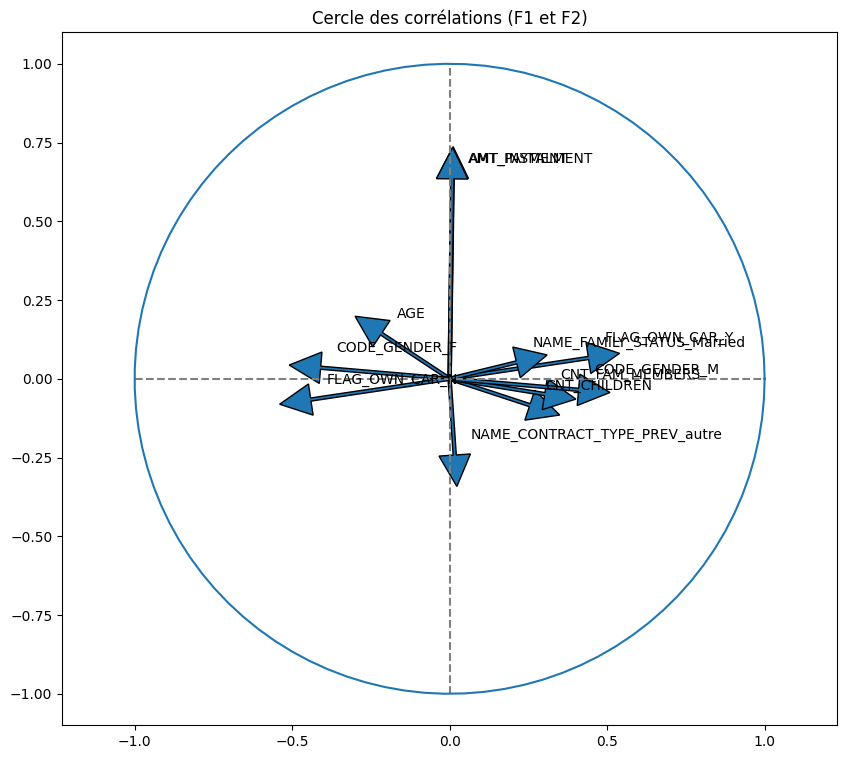

In [37]:
# Tracer le cercle de corrélation 
outils_analyses.correlation_graph(pca, (0,1), features)

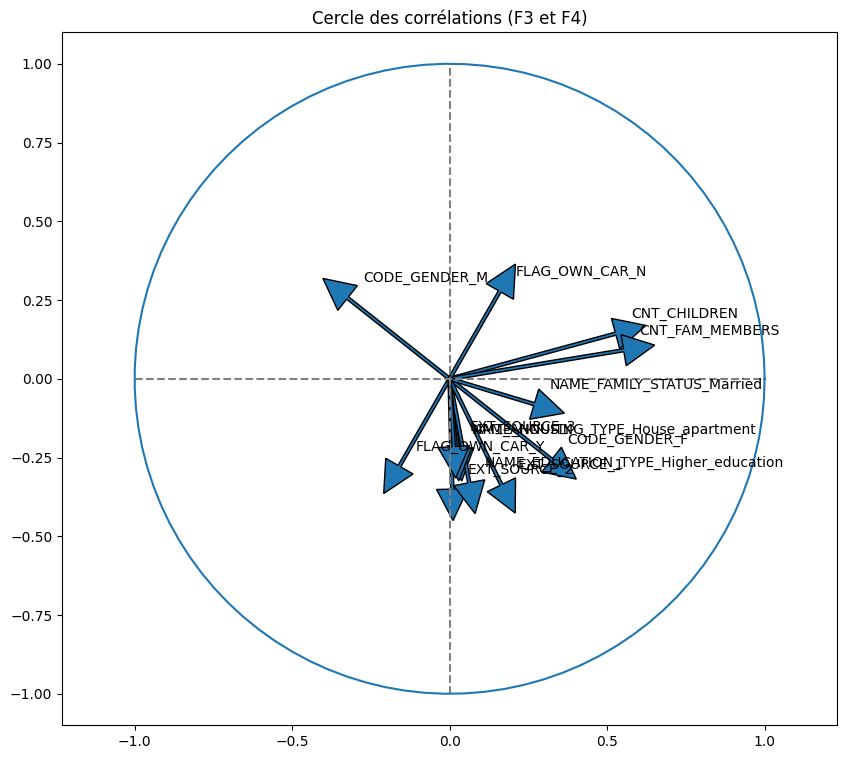

In [38]:
outils_analyses.correlation_graph(pca, (2,3), features)

## Dataframe final

In [39]:
df_wk.columns

Index(['CNT_CHILDREN', 'AMT_ANNUITY', 'AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2',
       'AMT_CREDIT_SUM', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT',
       'AMT_PAYMENT', 'AMT_CREDIT_PREV', 'NAME_CONTRACT_TYPE_Cash_loans',
       'CODE_GENDER_F', 'CODE_GENDER_M', 'FLAG_OWN_CAR_N', 'FLAG_OWN_CAR_Y',
       'FLAG_OWN_REALTY_Y', 'NAME_INCOME_TYPE_Commercial_associate',
       'NAME_EDUCATION_TYPE_Higher_education', 'NAME_FAMILY_STATUS_Married',
       'NAME_HOUSING_TYPE_House_apartment', 'NAME_CONTRACT_TYPE_PREV_autre',
       'EXT_SOURCE_1', 'EXT_SOURCE_3'],
      dtype='object')

In [40]:
df_wk = df_wk[['CNT_CHILDREN', 'AMT_ANNUITY', 'AGE', 'CNT_FAM_MEMBERS',
       'AMT_CREDIT_SUM', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT',
       'AMT_PAYMENT', 'AMT_CREDIT_PREV', 'NAME_CONTRACT_TYPE_Cash_loans',
       'CODE_GENDER_F', 'CODE_GENDER_M', 'FLAG_OWN_CAR_N', 'FLAG_OWN_CAR_Y',
       'FLAG_OWN_REALTY_Y', 'NAME_INCOME_TYPE_Commercial_associate',
       'NAME_EDUCATION_TYPE_Higher_education', 'NAME_FAMILY_STATUS_Married',
       'NAME_HOUSING_TYPE_House_apartment', 'EXT_SOURCE_1',
       'EXT_SOURCE_2','EXT_SOURCE_3']]

### Renommage des colonnes

In [41]:
# Créer un dictionnaire de correspondance entre les anciens noms et les nouveaux noms
rename_mapping = {
    'EXT_SOURCE_1': 'Scoring_externe_1',
    'EXT_SOURCE_2': 'Scoring_externe_2',
    'EXT_SOURCE_3': 'Scoring_externe_3',
    'CNT_CHILDREN': 'Nombre_d_enfants', 
    'CNT_FAM_MEMBERS': 'Nombre_de_membres_dans_la_famille',
    'AMT_CREDIT_SUM': 'Montant_total_du_credit',
    'NUM_INSTALMENT_NUMBER': 'Nombre_de_versements', 
    'AMT_PAYMENT': 'Montant_du_remboursement', 
    'AMT_CREDIT_PREV': 'Montant_du_crédit_precedent',
    'NAME_CONTRACT_TYPE_Cash_loans': 'Type_de_contrat_Pret_d_especes',
    'CODE_GENDER_F': 'Femme',
    'CODE_GENDER_M': 'Homme',
    'FLAG_OWN_CAR_N': 'Ne_possede_pas_de_vehicule',
    'FLAG_OWN_CAR_Y': 'Possede_un_vehicule',
    'FLAG_OWN_REALTY_Y': 'Possede_son_logement',
    'NAME_INCOME_TYPE_Commercial_associate' : 'Revenu_Non_salarie',
    'NAME_EDUCATION_TYPE_Higher_education': 'Etudes_Superieures',
    'NAME_FAMILY_STATUS_Married': 'Marie',
    'NAME_HOUSING_TYPE_House_apartment': 'Habite_en_appartement',
    'AMT_ANNUITY': 'Montant_annuite',
    'AMT_INSTALMENT': 'montant_du_versement'
}

# Utiliser la méthode rename() pour renommer les colonnes du DataFrame
df_wk.rename(columns=rename_mapping, inplace=True)

In [42]:
df_wk.columns

Index(['Nombre_d_enfants', 'Montant_annuite', 'AGE',
       'Nombre_de_membres_dans_la_famille', 'Montant_total_du_credit',
       'Nombre_de_versements', 'montant_du_versement',
       'Montant_du_remboursement', 'Montant_du_crédit_precedent',
       'Type_de_contrat_Pret_d_especes', 'Femme', 'Homme',
       'Ne_possede_pas_de_vehicule', 'Possede_un_vehicule',
       'Possede_son_logement', 'Revenu_Non_salarie', 'Etudes_Superieures',
       'Marie', 'Habite_en_appartement', 'Scoring_externe_1',
       'Scoring_externe_2', 'Scoring_externe_3'],
      dtype='object')

In [43]:
# Séparation des données
X_train, X_val, y_train, y_val = train_test_split(df_wk, y, test_size=0.2, random_state=random_seed)


In [44]:
X_train.head()

,Nombre_d_enfants,Montant_annuite,AGE,Nombre_de_membres_dans_la_famille,Montant_total_du_credit,Nombre_de_versements,montant_du_versement,Montant_du_remboursement,Montant_du_crédit_precedent,Type_de_contrat_Pret_d_especes,Femme,Homme,Ne_possede_pas_de_vehicule,Possede_un_vehicule,Possede_son_logement,Revenu_Non_salarie,Etudes_Superieures,Marie,Habite_en_appartement,Scoring_externe_1,Scoring_externe_2,Scoring_externe_3
242593,0.0,17216.0,39.0,1.0,0.0,1.0,8456.0,8456.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.27319,0.32349,0.14917
160051,0.0,35552.0,48.0,2.0,0.0,3.0,20460.0,20460.0,34240.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.79590,0.21155,0.23926
242147,2.0,17504.0,39.0,4.0,0.0,15.0,53280.0,53280.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.74268,0.35107,0.72510
30611,0.0,30624.0,46.0,2.0,0.0,4.0,6452.0,6452.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.00000,0.71582,0.54590
871,0.0,0.0,28.0,1.0,58340.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.38623,0.68311,0.00000


In [45]:
# Vérifier les tailles des jeux de données
print("Taille du jeu d'entraînement complet :", len(X_train))
print("Taille du jeu de validation initial :", len(X_val))

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

Taille du jeu d'entraînement complet : 246006
Taille du jeu de validation initial : 61502
(246006, 22) (246006,)
(61502, 22) (61502,)


## DUMMY REGESSOR et Logistic Regression

In [46]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error, fbeta_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline


# Créer chaque étape individuelle
smote = SMOTE(random_state=0)
logistic_regression = LogisticRegression(solver='lbfgs', max_iter=1000)

# Créer le pipeline
model = make_pipeline(smote, logistic_regression)

# Créer un dictionnaire pour stocker les résultats
results = {}

# Entraîner et évaluer les classifieurs
for clf_name, classifier in [('Dummy Classifier', DummyClassifier()), ('Logistic Regression', logistic_regression), ('SMOTE + Logistic Regression', model)]:
    classifier.fit(X_train, y_train)
    y_pred_train = classifier.predict(X_train)
    y_pred_test = classifier.predict(X_val)
    
    # Calculer les métriques pour l'ensemble d'entraînement
    r2_train = r2_score(y_train, y_pred_train)
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    f2_train = fbeta_score(y_train, y_pred_train, beta=2, average='binary')
    accuracy_train = accuracy_score(y_train, y_pred_train)
    
    # Calculer les métriques pour l'ensemble de test
    r2_test = r2_score(y_val, y_pred_test)
    mse_test = mean_squared_error(y_val, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    f2_test = fbeta_score(y_val, y_pred_test, beta=2, average='binary')
    accuracy_test = accuracy_score(y_val, y_pred_test)
    
    # Stocker les résultats dans le dictionnaire
    results[clf_name] = {
        'R2 (Entraînement)': r2_train,
        'MSE (Entraînement)': mse_train,
        'RMSE (Entraînement)': rmse_train,
        'F2 (Entraînement)': f2_train,
        'Précision (Entraînement)': accuracy_train,
        'R2 (Test)': r2_test,
        'MSE (Test)': mse_test,
        'RMSE (Test)': rmse_test,
        'F2 (Test)': f2_test,
        'Précision (Test)': accuracy_test
    }

# Créer un DataFrame à partir du dictionnaire de résultats
results_df = pd.DataFrame(results)

# Afficher le DataFrame
print(results_df)


                          Dummy Classifier  Logistic Regression  \
R2 (Entraînement)                 -0.08783             -0.08783   
MSE (Entraînement)                 0.08074              0.08074   
RMSE (Entraînement)                0.28415              0.28415   
F2 (Entraînement)                  0.00000              0.00000   
Précision (Entraînement)           0.91926              0.91926   
R2 (Test)                         -0.08774             -0.08774   
MSE (Test)                         0.08066              0.08066   
RMSE (Test)                        0.28401              0.28401   
F2 (Test)                          0.00000              0.00000   
Précision (Test)                   0.91934              0.91934   

                          SMOTE + Logistic Regression  
R2 (Entraînement)                            -3.92217  
MSE (Entraînement)                            0.36534  
RMSE (Entraînement)                           0.60443  
F2 (Entraînement)                     

### ROC curves

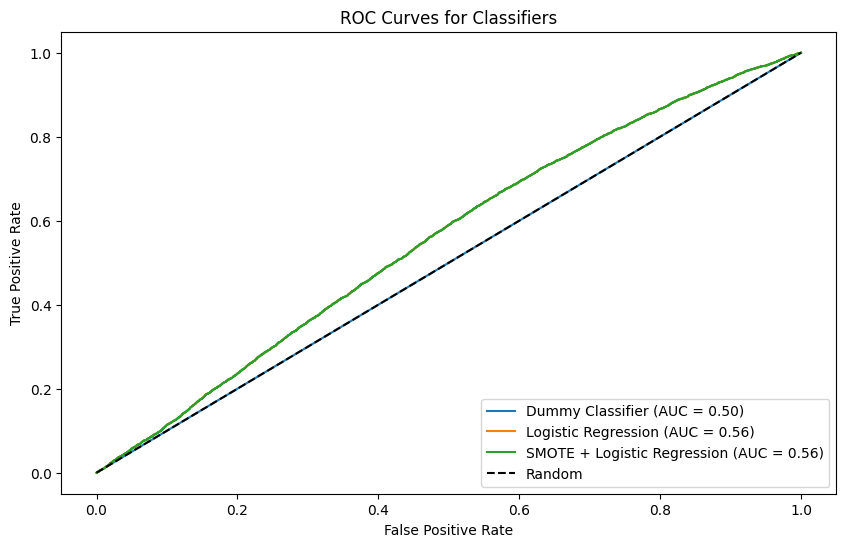

In [47]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# classifiers is a dictionary containing your trained classifiers
# X_train and y_train are your training data and corresponding target labels

# Create a dictionary of classifiers containing the trained classifiers
classifiers = {
    'Dummy Classifier': DummyClassifier(),
    'Logistic Regression': logistic_regression,
    'SMOTE + Logistic Regression': model
}

# Train the "Dummy Classifier"
classifiers['Dummy Classifier'].fit(X_train, y_train)

# Create a new figure to display all ROC curves on the same line
plt.figure(figsize=(10, 6))

# For each classifier in the dictionary
for clf_name, classifier in classifiers.items():
    # Get the prediction probabilities for the positive class
    y_pred_prob = classifier.predict_proba(X_val)[:, 1]
    
    # Calculate the False Positive Rate (FPR), True Positive Rate (TPR), and thresholds
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
    
    # Calculate the Area Under the ROC Curve (AUC)
    roc_auc = auc(fpr, tpr)
    
    # Plot the ROC curve for the current classifier on the same line
    plt.plot(fpr, tpr, label=f"{clf_name} (AUC = {roc_auc:.2f})")

# Plot the random ROC curve (dashed line)
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Add titles and labels
plt.title('ROC Curves for Classifiers')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Show all the ROC curves on the same line
plt.show()


### Recall curves

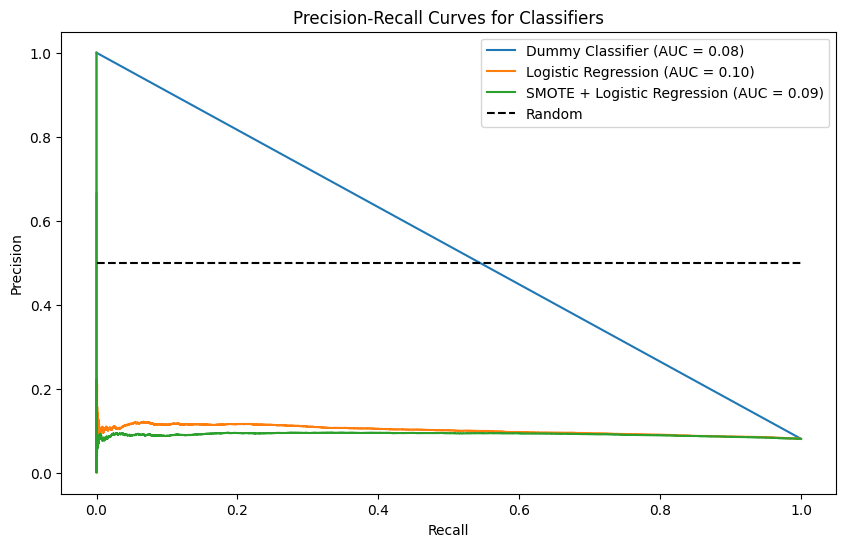

In [49]:
import matplotlib.pyplot as plt

from sklearn.metrics import precision_recall_curve, average_precision_score

# Create a dictionary of classifiers containing the trained classifiers
classifiers = {
    'Dummy Classifier': DummyClassifier(),
    'Logistic Regression': logistic_regression,
    'SMOTE + Logistic Regression': model
}

# Create a new figure to display all PRC curves on the same plot
plt.figure(figsize=(10, 6))

# For each classifier in the dictionary
for clf_name, classifier in classifiers.items():
    # Fit the classifier on the training data
    classifier.fit(X_train, y_train)
    
    # Get the prediction scores for the positive class
    y_pred_score = classifier.predict_proba(X_val)[:, 1]
    
    # Calculate Precision-Recall Curve (PRC) and average precision score
    precision, recall, _ = precision_recall_curve(y_val, y_pred_score)
    prc_auc = average_precision_score(y_val, y_pred_score)
    
    # Plot the PRC curve for the current classifier on the same plot
    plt.plot(recall, precision, label=f"{clf_name} (AUC = {prc_auc:.2f})")

# Add a random PRC curve (dashed line)
plt.plot([0, 1], [0.5, 0.5], 'k--', label='Random')

# Add titles and labels
plt.title('Precision-Recall Curves for Classifiers')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='upper right')

# Show all the PRC curves on the same plot
plt.show()


### Matrices de confusion 

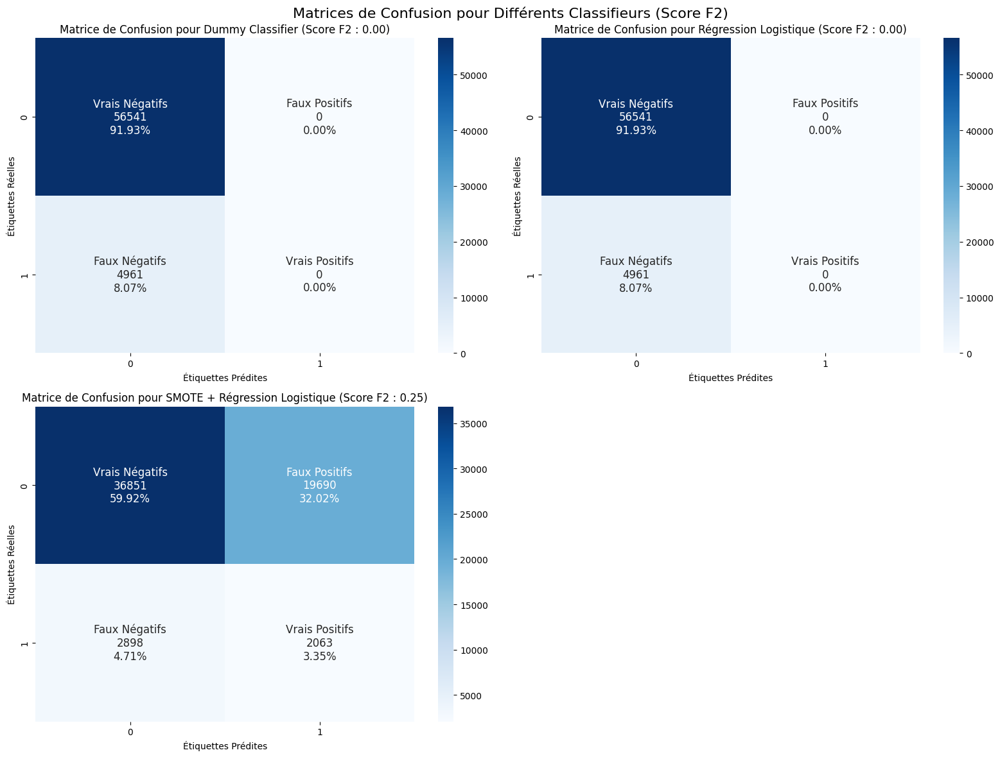

In [50]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, fbeta_score
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline

# Créez chaque étape individuelle
smote = SMOTE(random_state=0)
logistic_regression = LogisticRegression(solver='lbfgs', max_iter=1000)

# Créez les classifieurs avec SMOTE dans le pipeline
classifiers = {
    'Dummy Classifier': DummyClassifier(),
    'Régression Logistique': logistic_regression,
    'SMOTE + Régression Logistique': make_pipeline(smote, logistic_regression)
}

# Créez une figure pour afficher toutes les matrices de confusion
plt.figure(figsize=(16, 12))

# Entraînez et évaluez les classifieurs
for i, (clf_name, classifier) in enumerate(classifiers.items()):
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)

    # Calculez la matrice de confusion
    conf_mat = confusion_matrix(y_val, y_pred)

    # Créez une sous-figure pour la matrice de confusion actuelle
    plt.subplot(2, 2, i+1)

    # Définissez les noms de groupe pour la matrice de confusion
    group_names = ['Vrais Négatifs', 'Faux Positifs', 'Faux Négatifs', 'Vrais Positifs']

    # Convertissez les valeurs en chaînes de caractères pour les annotations
    group_counts = ["{0:0.0f}".format(value) for value in conf_mat.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten() / np.sum(conf_mat)]

    # Combinez les noms de groupe, les comptes et les pourcentages pour les annotations
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)

    # Créez la matrice de chaleur en utilisant seaborn
    sns.heatmap(conf_mat, annot=labels, fmt="", cmap='Blues', annot_kws={'fontsize': 12})

    # Ajoutez un titre et des étiquettes pour chaque sous-figure
    f2 = fbeta_score(y_val, y_pred, beta=2)  # Calculate F2 score
    plt.title(f'Matrice de Confusion pour {clf_name} (Score F2 : {f2:.2f})')
    plt.xlabel('Étiquettes Prédites')
    plt.ylabel('Étiquettes Réelles')

# Ajoutez un titre global à la figure
plt.suptitle('Matrices de Confusion pour Différents Classifieurs (Score F2)', fontsize=16)

# Ajustez automatiquement les espaces entre les sous-figures
plt.tight_layout()

# Affichez toutes les matrices de confusion sur la même figure
plt.show()


# Comparaison de différents modeles

## Modèles sans hyperparamètres

### SVC 

In [51]:
# Importation du module LinearSVC de scikit-learn et du module SMOTE de imbalanced-learn
from sklearn.svm import LinearSVC
from imblearn.over_sampling import SMOTE
import time

# Création de l'objet SMOTE (Sur-échantillonnage)
smote = SMOTE()

# Démarrage du chronomètre pour mesurer le temps d'entraînement
training_start = time.perf_counter()

# Création du modèle LinearSVC
modele = LinearSVC(dual=False)

# Entraînement du modèle sur les données d'entraînement rééchantillonnées
modele.fit(X_train, y_train)

# Arrêt du chronomètre d'entraînement
training_end = time.perf_counter()
training_time = training_end - training_start
print("Temps d'entraînement:", training_time, "secondes")

# Obtention des prédictions du modèle sur l'ensemble de validation
y_pred = modele.predict(X_val)


Temps d'entraînement: 0.7901809579925612 secondes


### Random Forest Classifier

In [52]:
# Importation du module RandomForestClassifier de scikit-learn, du module make_pipeline et du module SMOTE de imbalanced-learn
from sklearn.ensemble import RandomForestClassifier
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
import time

# Création du pipeline avec SMOTE et le modèle RandomForestClassifier
modele = make_pipeline(
    SMOTE(), 
    RandomForestClassifier()
)

# Démarrage du chronomètre pour mesurer le temps d'entraînement
training_start = time.perf_counter()

# Entraînement du modèle avec SMOTE sur les données d'entraînement
modele.fit(X_train, y_train)

# Arrêt du chronomètre d'entraînement
training_end = time.perf_counter()
training_time = training_end - training_start
print("Temps d'entraînement:", training_time, "secondes")

# Obtention des prédictions du modèle sur l'ensemble de validation
y_pred = modele.predict(X_val)


Temps d'entraînement: 57.68833845900372 secondes


### XGB Classifier

In [53]:
# Importation du module xgboost, du module make_pipeline et du module SMOTE de imbalanced-learn
import xgboost as xgb
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
import time

# Création du pipeline avec SMOTE et le modèle XGBoost
modele = make_pipeline(
    SMOTE(), 
    xgb.XGBClassifier()
)

# Démarrage du chronomètre pour mesurer le temps d'entraînement
training_start = time.perf_counter()

# Entraînement du modèle avec SMOTE sur les données d'entraînement
modele.fit(X_train, y_train)

# Arrêt du chronomètre d'entraînement
training_end = time.perf_counter()
training_time = training_end - training_start
print("Temps d'entraînement:", training_time, "secondes")

# Obtention des prédictions du modèle sur l'ensemble de validation
y_pred = modele.predict(X_val)


Temps d'entraînement: 10.70550108399766 secondes


### Light GBM

In [54]:
# Importation du module xgboost, du module make_pipeline et du module SMOTE de imbalanced-learn
import xgboost as xgb
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
import time

# Création du pipeline avec SMOTE et le modèle XGBoost
modele = make_pipeline(
    SMOTE(), 
    xgb.XGBClassifier()
)

# Démarrage du chronomètre pour mesurer le temps d'entraînement
training_start = time.perf_counter()

# Entraînement du modèle avec SMOTE sur les données d'entraînement
modele.fit(X_train, y_train)

# Arrêt du chronomètre d'entraînement
training_end = time.perf_counter()
training_time = training_end - training_start
print("Temps d'entraînement:", training_time, "secondes")

# Obtention des prédictions du modèle sur l'ensemble de validation
y_pred = modele.predict(X_val)


Temps d'entraînement: 10.711871334002353 secondes


### Courbes AUC ROC

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[LightGBM] [Info] Number of positive: 19863, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2261
[LightGBM] [Info] Number of data points in the train set: 246006, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080742 -> initscore=-2.432309
[LightGBM] [Info] Start training from score -2.432309


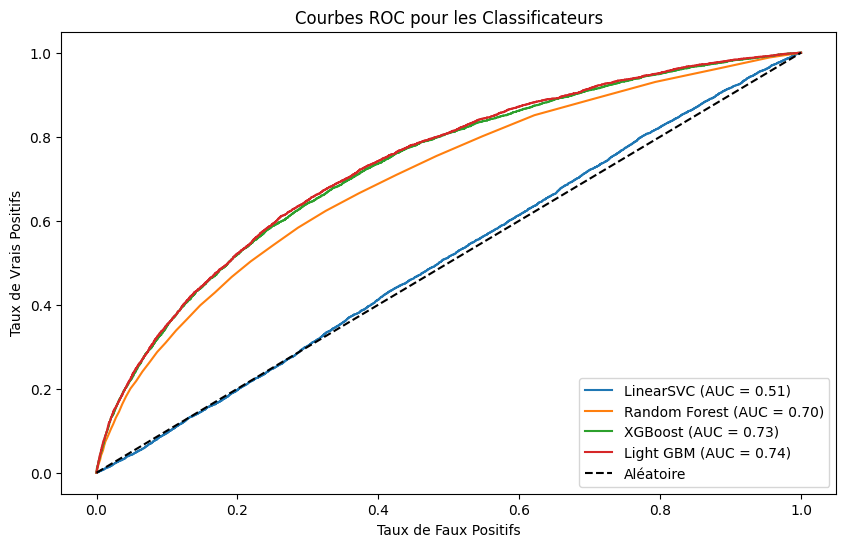

In [55]:
# Importation du module matplotlib.pyplot pour la visualisation, ainsi que des classificateurs
# LinearSVC, RandomForestClassifier, XGBClassifier et LGBMClassifier
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.metrics import roc_curve, auc

# Création d'un dictionnaire de classificateurs contenant les classificateurs entraînés
classificateurs = {
    'LinearSVC': LinearSVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'Light GBM': lgb.LGBMClassifier()
}

# Création d'une nouvelle figure pour afficher toutes les courbes ROC sur le même graphique
plt.figure(figsize=(10, 6))

# Pour chaque classificateur dans le dictionnaire
for nom_clf, classifieur in classificateurs.items():
    # Entraînement du classificateur sur les données d'entraînement
    classifieur.fit(X_train, y_train)
    
    # Obtention des scores de décision pour la classe positive
    if hasattr(classifieur, 'decision_function'):
        y_pred_score = classifieur.decision_function(X_val)
    else:
        y_pred_score = classifieur.predict_proba(X_val)[:, 1]
    
    # Calcul du taux de faux positifs (FPR), du taux de vrais positifs (TPR) et des seuils
    fpr, tpr, seuils = roc_curve(y_val, y_pred_score)
    
    # Calcul de l'aire sous la courbe ROC (AUC)
    roc_auc = auc(fpr, tpr)
    
    # Tracé de la courbe ROC pour le classificateur actuel sur le même graphique
    plt.plot(fpr, tpr, label=f"{nom_clf} (AUC = {roc_auc:.2f})")

# Tracé de la courbe ROC aléatoire (ligne en pointillés)
plt.plot([0, 1], [0, 1], 'k--', label='Aléatoire')

# Ajout de titres et d'étiquettes
plt.title('Courbes ROC pour les Classificateurs')
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.legend(loc='lower right')

# Affichage de toutes les courbes ROC sur le même graphique
plt.show()


### Matrices de confusion

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVC Metrics:
F2 Score: 0.31
Random Forest Metrics:
F2 Score: 0.02
XGBoost Metrics:
F2 Score: 0.03
[LightGBM] [Info] Number of positive: 226143, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5610
[LightGBM] [Info] Number of data points in the train set: 452286, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Light GBM Metrics:
F2 Score: 0.03


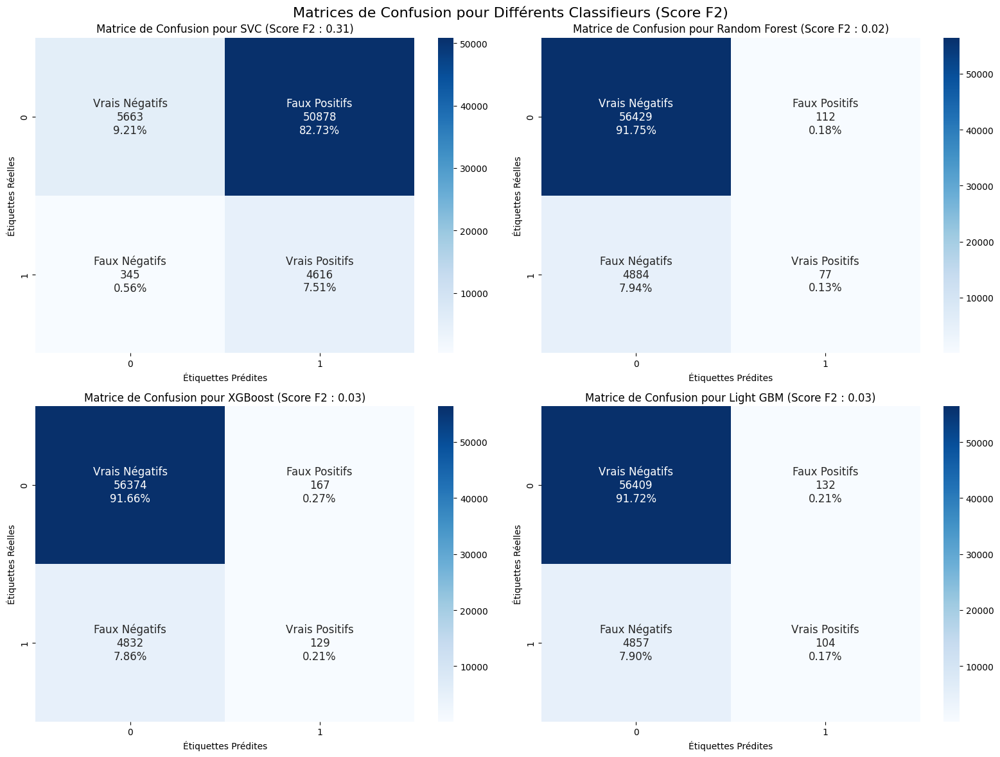

In [56]:
# Importation du module numpy, de seaborn, de matplotlib.pyplot, des classificateurs, 
# de confusion_matrix, et des modules de scikit-learn et imbalanced-learn nécessaires
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE


# Définissez une fonction personnalisée pour calculer le score F2 pour la classification
def f2_score_classification(y_true, y_pred, beta=2):
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f2_score = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall)
    return f2_score

# Créez les classifieurs avec SMOTE dans le pipeline
classifiers = {
    'SVC': LinearSVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'Light GBM': lgb.LGBMClassifier()
}

# Créez une figure pour afficher toutes les matrices de confusion
plt.figure(figsize=(16, 12))

# Créez une copie des échantillons de test réels (avant l'application de SMOTE)
X_test_real = X_val.copy()
y_test_real = y_val.copy()

# Entraînez et évaluez les classifieurs
for i, (clf_name, classifier) in enumerate(classifiers.items()):
    pipeline = Pipeline([('SMOTE', SMOTE()), ('Classifier', classifier)])
    pipeline.fit(X_train, y_train)
    
    # Effectuez les prédictions sur les échantillons de test réels (non synthétiques)
    y_pred_real = pipeline.predict(X_test_real)
    
    # Calculate the F2 score for classification
    f2 = f2_score_classification(y_test_real, y_pred_real)

    # Print the evaluation metrics
    print(f"{clf_name} Metrics:")
    print(f"F2 Score: {f2:.2f}")

    # Calculez la matrice de confusion
    conf_mat = confusion_matrix(y_test_real, y_pred_real)

    # Créez une sous-figure pour la matrice de confusion actuelle
    plt.subplot(2, 2, i+1)

    # Définissez les noms de groupe pour la matrice de confusion
    group_names = ['Vrais Négatifs', 'Faux Positifs', 'Faux Négatifs', 'Vrais Positifs']

    # Convertissez les valeurs en chaînes de caractères pour les annotations
    group_counts = ["{0:0.0f}".format(value) for value in conf_mat.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten() / np.sum(conf_mat)]

    # Combinez les noms de groupe, les comptes et les pourcentages pour les annotations
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)

    # Créez la matrice de chaleur en utilisant seaborn
    sns.heatmap(conf_mat, annot=labels, fmt="", cmap='Blues', annot_kws={'fontsize': 12})

    # Ajoutez un titre et des étiquettes pour chaque sous-figure
    plt.title(f'Matrice de Confusion pour {clf_name} (Score F2 : {f2:.2f})')
    plt.xlabel('Étiquettes Prédites')
    plt.ylabel('Étiquettes Réelles')

# Ajoutez un titre global à la figure
plt.suptitle('Matrices de Confusion pour Différents Classifieurs (Score F2)', fontsize=16)

# Ajustez automatiquement les espaces entre les sous-figures
plt.tight_layout()

# Affichez toutes les matrices de confusion sur la même figure
plt.show()


## Recherche des hyperparametres 

Pour modéliser la relation de nos feature nous allons utiliser les modèles suivants :

- SVC
- Random Forest
- XG Boost
- Light GBM

Nous allons rechercher les hyperparamètres les plus adaptés afin d'obtenir les meilleures performances, nous utiliserons pour cela la classe `GridSearchCV`. 
Les hyper-paramètres importants different selon les modeles . 


In [57]:
import os
import time
import mlflow
import mlflow.pyfunc
import xgboost as xgb
import lightgbm as lgb
import joblib

from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, cohen_kappa_score
from sklearn.model_selection import StratifiedKFold

# Configuration de l'environnement MLflow
os.environ['MLFLOW_TRACKING_USERNAME'] = 'name'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'pass'
mlflow.set_tracking_uri("http://127.0.0.1:5000")
mlflow.set_experiment("Projet_7")

class CustomModel(mlflow.pyfunc.PythonModel):
    def __init__(self, pipeline):
        self.pipeline = pipeline

    def load_context(self, context):
        pass  # Intentionally empty for this example

    def predict(self, context, model_input):
        return self.pipeline.predict(model_input)
    
# Fonction pour imprimer et enregistrer les métriques
def print_and_log_metrics(y_true, y_pred, model_name):
    metrics = {
        "Precision": precision_score(y_true, y_pred),
        "Recall": recall_score(y_true, y_pred),
        "F2-Score": fbeta_score(y_true, y_pred, beta=2, average='micro'),
        "AUC-ROC": roc_auc_score(y_true, y_pred),
        "Cohen_Kappa": cohen_kappa_score(y_true, y_pred),  # Added Cohen's Kappa
        "Accuracy": accuracy_score(y_true, y_pred)
    }

    print(f"METRICS FOR {model_name} _______________")
    for metric_name, metric_value in metrics.items():
        print(f"{metric_name}: {metric_value}")
        mlflow.log_metric(metric_name, metric_value)
    print("")

# Fonction pour entraîner et évaluer les modèle
def train_and_evaluate_model(model, param_grid, model_name, X_train, y_train, X_val, y_val):
    stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

    # Créer un scoreur F2 personnalisé
    f2_scorer = make_scorer(fbeta_score, beta=2)
    # Utiliser le scoreur F2 dans GridSearchCV
    gs = GridSearchCV(model, param_grid=param_grid, cv=stratified_kfold, scoring=f2_scorer, verbose=1, n_jobs=-1)

    # Démarrage du suivi MLflow
    with mlflow.start_run(run_name=model_name):
        training_start = time.perf_counter()
        gs.fit(X_train, y_train)
        training_end = time.perf_counter()

        # Enregistrement des paramètres et métriques
        mlflow.log_params(gs.best_params_)
        training_time = training_end - training_start
        mlflow.log_metric("Training Time", training_time)
        mlflow.log_metric("Best Score", gs.best_score_)

        # Code spécifique au modèle pour extraire le classificateur
        if model_name == "LightGBM":
            classifier = gs.best_estimator_.named_steps["lgbmclassifier"]
        else:
            classifier = gs.best_estimator_.named_steps[model_name.lower()]

        # Enregistrement des importances des caractéristiques
        if model_name == "LinearSVC":
            feature_importances = classifier.coef_[0]
        else:
            feature_importances = classifier.feature_importances_
            
        with open(f"feature_importances_{model_name.lower()}.txt", "w") as f:
            for i, importance in enumerate(feature_importances):
                f.write(f"Feature {i}: {importance}\n")
        mlflow.log_artifact(f"feature_importances_{model_name.lower()}.txt")
        
        # Enregistrement du modèle
        mlflow.pyfunc.log_model(artifact_path="model", python_model=CustomModel(gs.best_estimator_))

        y_pred = gs.predict(X_val)
        print_and_log_metrics(y_val, y_pred, model_name)

    return gs

# Entraînement et évaluation des modèles
gs_svc = train_and_evaluate_model(make_pipeline(SMOTE(), LinearSVC(dual=False)), 
                                  {'linearsvc__C': [0.01, 0.1, 1]}, 
                                  "LinearSVC", X_train, y_train, X_val, y_val)

gs_rfc = train_and_evaluate_model(make_pipeline(SMOTE(), RandomForestClassifier()), 
                                  {"randomforestclassifier__n_estimators": [200, 500], "randomforestclassifier__max_depth": [5, 10]}, 
                                  "RandomForestClassifier", X_train, y_train, X_val, y_val)

gs_xgb = train_and_evaluate_model(make_pipeline(SMOTE(), xgb.XGBClassifier()), 
                                  {'xgbclassifier__objective': ['binary:logistic'], 'xgbclassifier__booster': ['gbtree', 'gblinear'], "xgbclassifier__n_estimators": [200, 500, 800, 1000]}, 
                                  "XGBClassifier", X_train, y_train, X_val, y_val)

lgbm_params = {'verbosity': -1}
gs_lgb = train_and_evaluate_model(make_pipeline(SMOTE(), lgb.LGBMClassifier(**lgbm_params)), 
                                  {'lgbmclassifier__num_iterations': [1500, 2000], 'lgbmclassifier__learning_rate': [0.05, 0.005], 'lgbmclassifier__num_leaves': [15, 31], 'lgbmclassifier__max_depth': [15, 25], 'lgbmclassifier__min_data_in_leaf': [15, 25]}, 
                                  "LightGBM", X_train, y_train, X_val, y_val)

# Fin de la session MLflow
mlflow.end_run()

# Enregistrez les modèles entraînés
for clf_name, classifier in classifiers.items():
    pipeline = Pipeline([('SMOTE', SMOTE()), ('Classifier', classifier)])
    pipeline.fit(X_train, y_train)
    joblib.dump(pipeline, f"{clf_name}_model.pkl")


Fitting 3 folds for each of 3 candidates, totalling 9 fits
METRICS FOR LinearSVC _______________
Precision: 0.14606124410674234
Recall: 0.6432170933279581
F2-Score: 0.6678807193262006
AUC-ROC: 0.6566309198091304
Cohen_Kappa: 0.12272508626278111
Accuracy: 0.6678807193262007

Fitting 3 folds for each of 4 candidates, totalling 12 fits


/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


METRICS FOR RandomForestClassifier _______________
Precision: 0.2030812324929972
Recall: 0.1461398911509776
F2-Score: 0.8848655328282007
AUC-ROC: 0.5479112112057395
Cohen_Kappa: 0.10987457911824428
Accuracy: 0.8848655328282007

Fitting 3 folds for each of 8 candidates, totalling 24 fits


/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


METRICS FOR XGBClassifier _______________
Precision: 0.14561087227846345
Recall: 0.6349526305180407
F2-Score: 0.6700269909921629
AUC-ROC: 0.6540285516892214
Cohen_Kappa: 0.12162356188438395
Accuracy: 0.6700269909921629

Fitting 3 folds for each of 32 candidates, totalling 96 fits


/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/Users/xparisot/anaconda

METRICS FOR LightGBM _______________
Precision: 0.4025974025974026
Recall: 0.024994960693408588
F2-Score: 0.9183603785242757
AUC-ROC: 0.5108703425175184
Cohen_Kappa: 0.03799561880220936
Accuracy: 0.9183603785242757



/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[LightGBM] [Info] Number of positive: 226143, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5609
[LightGBM] [Info] Number of data points in the train set: 452286, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


### Affichage des résultats 

#### Courbe AUC ROC

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[LightGBM] [Info] Number of positive: 19863, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2261
[LightGBM] [Info] Number of data points in the train set: 246006, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080742 -> initscore=-2.432309
[LightGBM] [Info] Start training from score -2.432309


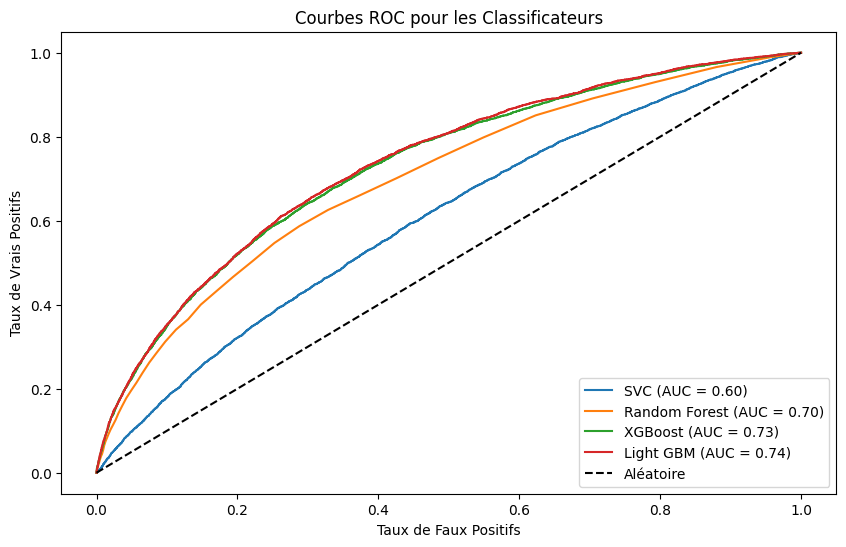

In [58]:
# Créez un dictionnaire de classificateurs contenant les classificateurs entraînés
classificateurs = {
    'SVC': LinearSVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'Light GBM': lgb.LGBMClassifier()
}

# Créez une nouvelle figure pour afficher toutes les courbes ROC sur le même graphique
plt.figure(figsize=(10, 6))

# Pour chaque classificateur dans le dictionnaire
for nom_clf, classifieur in classificateurs.items():
    # Entraînez le classificateur sur les données d'entraînement
    classifieur.fit(X_train, y_train)
    
    # Obtenez les scores de prédiction pour la classe positive
    if hasattr(classifieur, 'decision_function'):
        # Utilisez decision_function pour LinearSVC
        y_decision_score = classifieur.decision_function(X_val)
    else:
        # Utilisez predict_proba pour les autres classificateurs qui le prennent en charge (par exemple, RandomForest)
        y_decision_score = classifieur.predict_proba(X_val)[:, 1]
    
    # Calculez le taux de faux positifs (FPR), le taux de vrais positifs (TPR) et les seuils
    fpr, tpr, seuils = roc_curve(y_val, y_decision_score)
    
    # Calculez l'aire sous la courbe ROC (AUC)
    roc_auc = auc(fpr, tpr)
    
    # Tracez la courbe ROC pour le classificateur actuel sur le même graphique
    plt.plot(fpr, tpr, label=f"{nom_clf} (AUC = {roc_auc:.2f})")

# Tracez la courbe ROC aléatoire (ligne en pointillés)
plt.plot([0, 1], [0, 1], 'k--', label='Aléatoire')

# Ajoutez des titres et des étiquettes
plt.title('Courbes ROC pour les Classificateurs')
plt.xlabel('Taux de Faux Positifs')
plt.ylabel('Taux de Vrais Positifs')
plt.legend(loc='lower right')

# Affichez toutes les courbes ROC sur le même graphique
plt.show()


#### Matrices de confusion 

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


SVC Metrics:
Fbeta Score (beta=2): 0.87
Random Forest Metrics:
Fbeta Score (beta=2): 0.92
XGBoost Metrics:
Fbeta Score (beta=2): 0.92
[LightGBM] [Info] Number of positive: 226143, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5609
[LightGBM] [Info] Number of data points in the train set: 452286, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Light GBM Metrics:
Fbeta Score (beta=2): 0.92


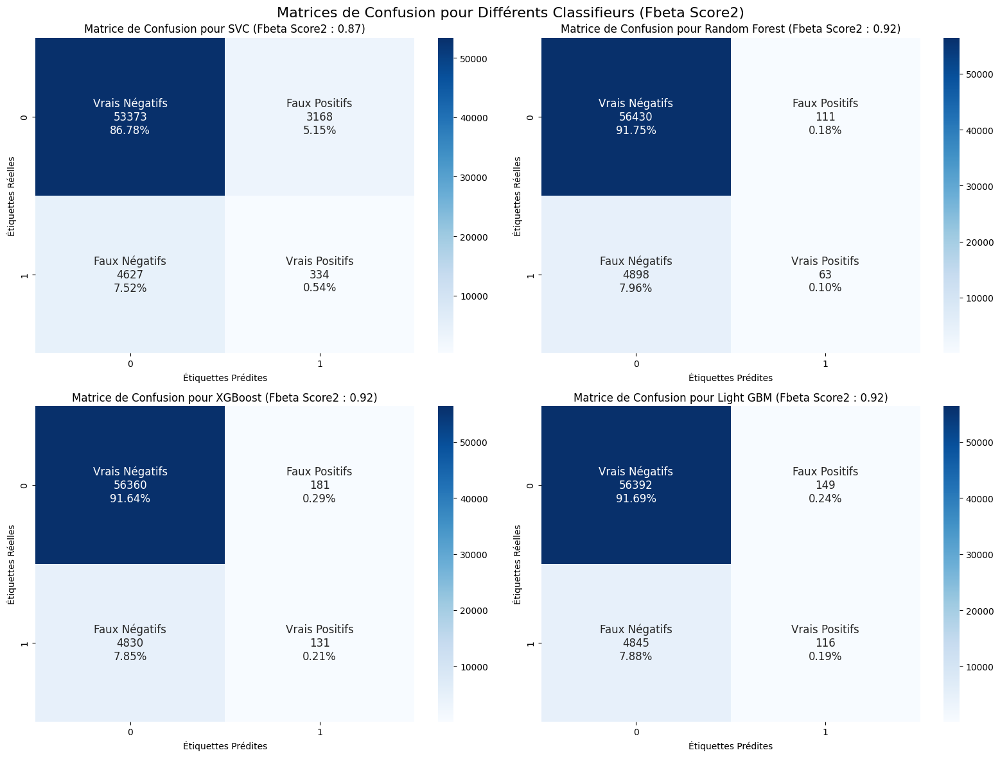

In [59]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, fbeta_score
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE

# Créez les classifieurs avec SMOTE dans le pipeline
classifiers = {
    'SVC': LinearSVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'Light GBM': lgb.LGBMClassifier()
}

# Créez une figure pour afficher toutes les matrices de confusion
plt.figure(figsize=(16, 12))

# Entraînez et évaluez les classifieurs
for i, (clf_name, classifier) in enumerate(classifiers.items()):
    pipeline = Pipeline([('SMOTE', SMOTE()), ('Classifier', classifier)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)

    # Calculate the Fbeta_score2 for classification (beta=2)
    f2 = fbeta_score(y_val, y_pred, beta=2, average='micro')  

    # Print the evaluation metrics
    print(f"{clf_name} Metrics:")
    print(f"Fbeta Score (beta=2): {f2:.2f}")

    # Calculez la matrice de confusion
    conf_mat = confusion_matrix(y_val, y_pred)

    # Créez une sous-figure pour la matrice de confusion actuelle
    plt.subplot(2, 2, i+1)

    # Définissez les noms de groupe pour la matrice de confusion
    group_names = ['Vrais Négatifs', 'Faux Positifs', 'Faux Négatifs', 'Vrais Positifs']

    # Convertissez les valeurs en chaînes de caractères pour les annotations
    group_counts = ["{0:0.0f}".format(value) for value in conf_mat.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten() / np.sum(conf_mat)]

    # Combinez les noms de groupe, les comptes et les pourcentages pour les annotations 
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)

    # Créez la matrice de chaleur en utilisant seaborn
    sns.heatmap(conf_mat, annot=labels, fmt="", cmap='Blues', annot_kws={'fontsize': 12})

    # Ajoutez un titre et des étiquettes pour chaque sous-figure
    plt.title(f'Matrice de Confusion pour {clf_name} (Fbeta Score2 : {f2:.2f})')
    plt.xlabel('Étiquettes Prédites')
    plt.ylabel('Étiquettes Réelles')

# Ajoutez un titre global à la figure
plt.suptitle('Matrices de Confusion pour Différents Classifieurs (Fbeta Score2)', fontsize=16)

# Ajustez automatiquement les espaces entre les sous-figures
plt.tight_layout()

# Affichez toutes les matrices de confusion sur la même figure
plt.show()


## Calcul du seuil pour le score personnalisé

La fonction custom score calcule un score personnalisé en fonction des faux négatifs et des faux positifs. Elle utilise une constante 
X pour pondérer l'importance des faux négatifs.

score = (X x FN + FP)/(FN + 1 x 10exp-10)

The model SVC does not support predict_proba. Skipped.


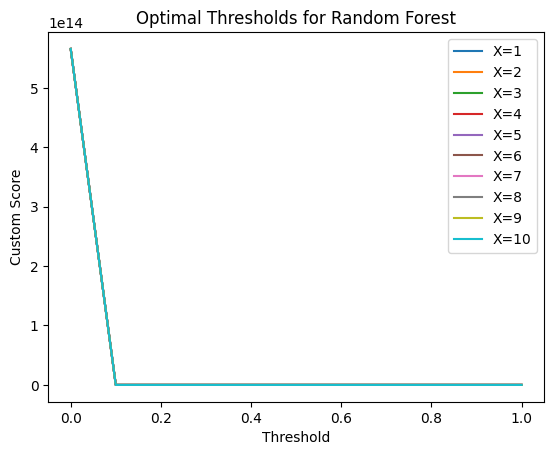

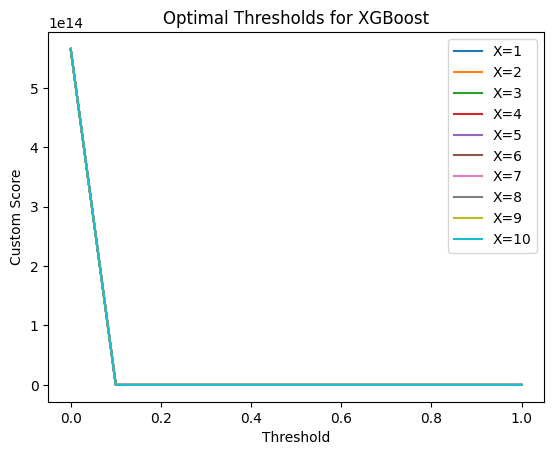

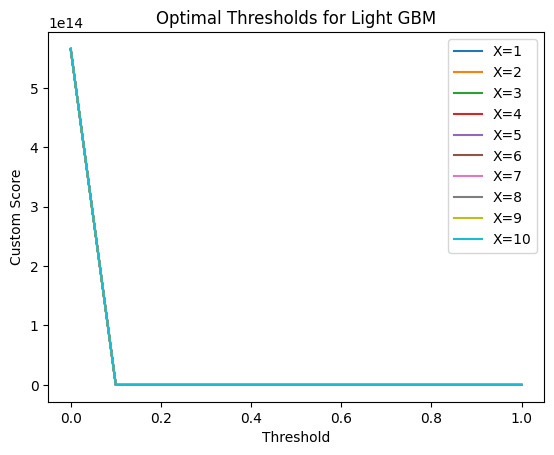

Best Values:
           Model  Best X  Best Threshold  Best Custom Score
0  Random Forest       1             0.8                1.0
1        XGBoost       1             1.0                1.0
2      Light GBM       1             0.9                1.0
All Optimal Values:
      X  Threshold  Custom Score          Model
0     1        0.0   5.65410e+14  Random Forest
1     1        0.1   1.52085e+01  Random Forest
2     1        0.2   3.21093e+00  Random Forest
3     1        0.3   1.45139e+00  Random Forest
4     1        0.4   1.12340e+00  Random Forest
..   ..        ...           ...            ...
325  10        0.6   1.00116e+01      Light GBM
326  10        0.7   1.00030e+01      Light GBM
327  10        0.8   1.00008e+01      Light GBM
328  10        0.9   1.00000e+01      Light GBM
329  10        1.0   1.00000e+01      Light GBM

[330 rows x 4 columns]
           Model  Best X  Best Threshold  Best Custom Score
0  Random Forest       1             0.8                1.0
1      

,Model,Best X,Best Threshold,Best Custom Score
0,Random Forest,1,0.8,1.0
1,XGBoost,1,1.0,1.0
2,Light GBM,1,0.9,1.0


In [61]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import joblib
import pandas as pd

# Initialize an empty list to store all the optimal_values dataframes for each model
all_optimal_values_list = []
# Initialize an empty list to store the best values for each model
best_values_list = []

# Function for custom score
def custom_score(y_true, y_pred, X):
    conf_mat = confusion_matrix(y_true, y_pred)
    FN = conf_mat[1, 0]
    FP = conf_mat[0, 1]
    score = (X * FN + FP) / (FN + 1e-10)
    return score

# Function to find the optimal threshold
def find_optimal_threshold_extended(model, X_val, y_val):
    y_proba = model.predict_proba(X_val)[:, 1]
    results = []
    for X in range(1, 11):
        for threshold in np.linspace(0, 1, 11):
            y_pred = (y_proba >= threshold).astype(int)
            score = custom_score(y_val, y_pred, X)
            results.append({'X': X, 'Threshold': threshold, 'Custom Score': score})
    return pd.DataFrame(results)

# Model names to load
model_names = ['SVC', 'Random Forest', 'XGBoost', 'Light GBM']

# Load the models and find the optimal thresholds
for model_name in model_names:
    model = joblib.load(f"{model_name}_model.pkl")  # Load the model (to be done in your environment)
    
    if not hasattr(model, 'predict_proba'):
        print(f"The model {model_name} does not support predict_proba. Skipped.")
        continue
    
    # Find the optimal values for this model
    optimal_values = find_optimal_threshold_extended(model, X_val, y_val)
    
    # Add model name to each row to identify which model the row belongs to
    optimal_values['Model'] = model_name
    
    # Append this dataframe to the list
    all_optimal_values_list.append(optimal_values)
    
    # Find the best combination of X and Threshold
    best_row = optimal_values.loc[optimal_values['Custom Score'].idxmin()]
    
    # Add these details to the DataFrame best_values
    best_values_list.append(pd.DataFrame([{
        'Model': model_name,
        'Best X': best_row['X'],
        'Best Threshold': best_row['Threshold'],
        'Best Custom Score': best_row['Custom Score']
    }]))
    
    # Generate a plot
    for X in range(1, 11):
        subset = optimal_values[optimal_values['X'] == X]
        plt.plot(subset['Threshold'], subset['Custom Score'], label=f'X={X}')
    
    plt.title(f'Optimal Thresholds for {model_name}')
    plt.xlabel('Threshold')
    plt.ylabel('Custom Score')
    plt.legend()
    plt.show()

# Concatenate all the best values to create the best_values DataFrame
best_values = pd.concat(best_values_list, ignore_index=True)

# Display the best_values DataFrame
print("Best Values:")
print(best_values)

# Concatenate all the dataframes in the list to create a single dataframe
all_optimal_values = pd.concat(all_optimal_values_list, ignore_index=True)

# Display the all_optimal_values DataFrame containing all calculated values
print("All Optimal Values:")
print(all_optimal_values)

# Display the best_values DataFrame
print(best_values)

# Concatenate all the dataframes in the list to create a single dataframe
all_optimal_values = pd.concat(all_optimal_values_list, ignore_index=True)

# Concatenate all the best values to create the best_values DataFrame
best_values = pd.concat(best_values_list, ignore_index=True)

# Display the best_values DataFrame
print("Best Values:")
best_values

## Explication du choix du modele

La précision est une mesure de performance pour les modèles de classification qui indique la proportion de vrais positifs par rapport au nombre total de cas classés comme positifs (vrais positifs et faux positifs). Mathématiquement, la précision est définie comme :

La formule de la précision est Precision = Vrais Positifs / (Vrais Positifs + Faux Positifs)

La précision est une mesure utile lorsque les coûts des faux positifs sont élevés. Par exemple, dans le filtrage de spams par e-mail, il est préférable de laisser passer quelques spams (faux négatifs) plutôt que de marquer des e-mails légitimes comme spam (faux positifs).

La précision seule, cependant, ne donne pas une image complète de la performance d'un modèle. Elle doit être utilisée en combinaison avec d'autres mesures telles que le rappel (sensibilité), le F1-Score ou le F2-Score pour obtenir une évaluation complète de la performance du modèle.

La précision varie entre 0 et 1, où une valeur de 1 indique une performance parfaite (tous les exemples positifs sont correctement classés et il n'y a pas de faux positifs), et une valeur de 0 indique la pire performance possible (tous les exemples positifs sont mal classés).

Dans les problèmes de classification déséquilibrés, où l'une des classes est beaucoup moins fréquente que l'autre, la précision peut être une mesure trompeuse. Dans de tels cas, d'autres métriques comme le rappel, le F1-Score ou le F2-Score sont souvent plus informatives.

------

Le rappel (aussi appelé sensibilité ou taux de vrais positifs) est une mesure de performance pour les modèles de classification qui indique la proportion de vrais positifs par rapport au nombre total d'observations positives réelles (vrais positifs et faux négatifs). Mathématiquement, le rappel est défini comme :

recall = (Vrai Positif)/(Vrai Positif+Faux)

Le rappel est particulièrement utile lorsque les coûts des faux négatifs sont élevés. Par exemple, dans un test médical pour une maladie grave, il est crucial de détecter tous les cas positifs, même si cela signifie que certains résultats faussement positifs seront inclus. 

Le rappel varie entre 0 et 1, où une valeur de 1 indique une performance parfaite (tous les exemples positifs sont correctement classés et il n'y a pas de faux négatifs), et une valeur de 0 indique la pire performance possible (tous les exemples positifs sont mal classés).

Tout comme pour la précision, le rappel seul ne donne pas une image complète de la performance d'un modèle. Il doit être utilisé en conjonction avec d'autres mesures, comme la précision, le F1-Score ou le F2-Score, pour une évaluation plus complète de la performance.

Dans les problèmes de classification déséquilibrés, le rappel peut être une mesure plus utile que la précision, car il se concentre sur la classe minoritaire qui est souvent celle d'intérêt.

------

le Cohen Kappa score prend en compte les faux positifs et les faux négatifs et est généralement utilisée pour mesurer la performance des modèles de classification sur des ensembles de données déséquilibrés.

Le coefficient Kappa varie de -1 à 1 :

Kappa = 1 : Représente un accord parfait entre les prédictions du modèle et les valeurs réelles.
Kappa = 0 : Signifie que les prédictions du modèle ne sont pas meilleures que des prédictions aléatoires.
Kappa < 0 : Indique que le modèle est en désaccord avec les valeurs réelles.
Voici comment interpréter les valeurs de Kappa :

0 à 0,20 : Accord faible
0,21 à 0,40 : Accord raisonnable
0,41 à 0,60 : Accord modéré
0,61 à 0,80 : Accord substantiel
0,81 à 1,00 : Accord presque parfait

------

Le F2-Score est une variante du score F1 qui accorde plus d'importance à la mesure de rappel (sensibilité) qu'à la précision. Le score F1 est la moyenne harmonique de la précision et du rappel, et il est défini comme suit :

Fβ=(1+β2)⋅precision⋅recall(β2⋅precision)+recall

Lorsque \(\beta = 1\), le F-beta score devient le F1 score. Cependant, lorsque \(\beta > 1\), le score accorde plus de poids au rappel qu'à la précision. En particulier, le F2-Score est un cas spécial du F-beta score où \(\beta = 2\), ce qui signifie que le rappel est considéré comme deux fois plus important que la précision.

Le F2-Score est utile dans les situations où les faux négatifs sont plus coûteux que les faux positifs. Par exemple, dans les applications médicales, manquer une condition médicale grave (un faux négatif) pourrait avoir des conséquences plus graves que de diagnostiquer faussement une condition (un faux positif).

Le F2-Score varie entre 0 et 1, où 1 indique une performance parfaite et 0 la pire performance possible.

-----
L'aire sous la courbe ROC (AUC) est une autre façon de mesurer les performances du modèle prédictif. Elle calcule l’aire située sous la courbe ROC (Receiver Operating Characteristic). L'AUC est liée à la capacité prédictive (CP) selon la formule suivante : CP = 2 * AUC - 1 Pour un modèle prédictif simple de définition du score avec une cible binaire, cela représente la probabilité d'une observation d'un signal choisi de façon aléatoire ayant un score plus élevé qu'une observation négative choisie de façon aléatoire (sans signal).

L'un des intérêts de l'aire sous la courbe ROC est son indépendance par rapport à la distribution cible. Par exemple, même si vous dupliquez chaque observation positive par deux en dupliquant les lignes dans l'ensemble de données, l'aire sous la courbe du modèle prédictif reste la même.

-----
L’accuracy est une métrique pour évaluer la performance des modèles de classification à 2 classes ou plus. L’accuracy peut être traduite par “précision” en français mais on risque alors de la confondre avec la métrique Precision.
Comme les autres métriques, l’accuracy est basée sur la matrice de confusion.
L’accuracy permet de décrire la performance du modèle sur les individus positifs et négatifs de façon symétrique. Elle mesure le taux de prédictions correctes sur l’ensemble des individus : (TP + TN) / (TP + TN + FP + FN)

### Calcul des Metrics 

In [62]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, cohen_kappa_score, accuracy_score

# Predictions
y_pred_svc = gs_svc.predict(X_val)
y_pred_rfc = gs_rfc.predict(X_val)
y_pred_xgb = gs_xgb.predict(X_val)
y_pred_lgb = gs_lgb.predict(X_val)

def print_metrics(y_true, y_pred, model_name):
    print(f"METRICS FOR {model_name} _______________")
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("AUC-ROC:", roc_auc_score(y_true, y_pred))
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Cohen's Kappa:", cohen_kappa_score(y_true, y_pred))
    print("F2-Score", fbeta_score(y_true, y_pred, beta=2, average='micro')) 
    print("")

# Affiche les metrics pour chaque modele
print_metrics(y_val, y_pred_svc, "LinearSVC")
print_metrics(y_val, y_pred_rfc, "Random Forest")
print_metrics(y_val, y_pred_xgb, "XGBoost")
print_metrics(y_val, y_pred_lgb, "Light GBM")


METRICS FOR LinearSVC _______________
Precision: 0.14606124410674234
Recall: 0.6432170933279581
AUC-ROC: 0.6566309198091304
Accuracy: 0.6678807193262007
Cohen's Kappa: 0.12272508626278111
F2-Score 0.6678807193262006

METRICS FOR Random Forest _______________
Precision: 0.2030812324929972
Recall: 0.1461398911509776
AUC-ROC: 0.5479112112057395
Accuracy: 0.8848655328282007
Cohen's Kappa: 0.10987457911824428
F2-Score 0.8848655328282007

METRICS FOR XGBoost _______________
Precision: 0.14561087227846345
Recall: 0.6349526305180407
AUC-ROC: 0.6540285516892214
Accuracy: 0.6700269909921629
Cohen's Kappa: 0.12162356188438395
F2-Score 0.6700269909921629

METRICS FOR Light GBM _______________
Precision: 0.4025974025974026
Recall: 0.024994960693408588
AUC-ROC: 0.5108703425175184
Accuracy: 0.9183603785242757
Cohen's Kappa: 0.03799561880220936
F2-Score 0.9183603785242757



### Modèles et leurs métriques

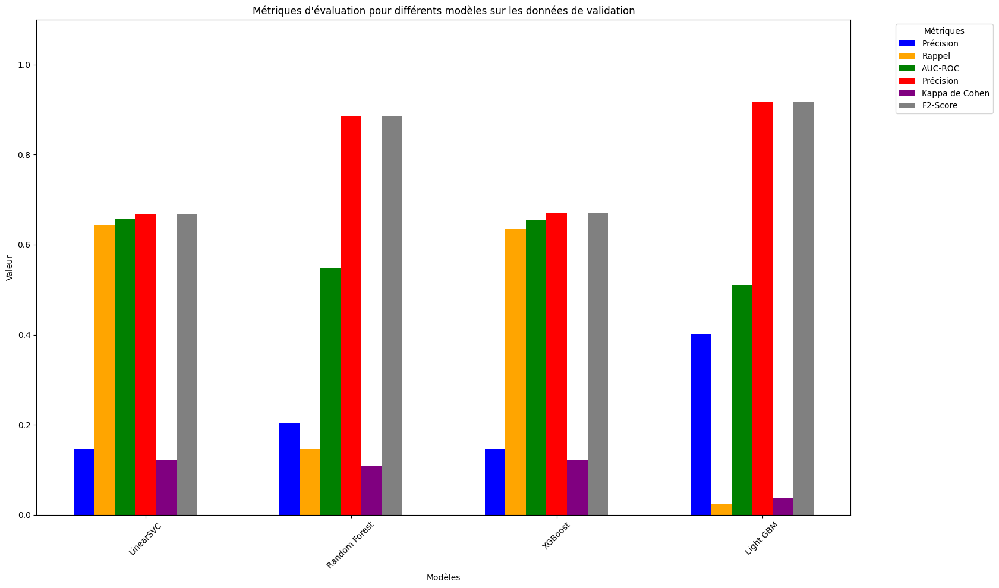

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Modèles à évaluer
modeles = ['LinearSVC', 'Random Forest', 'XGBoost', 'Light GBM']

# Fonction pour calculer les métriques
def calculer_metrics(y_true, y_pred):
    return [
        precision_score(y_true, y_pred),
        recall_score(y_true, y_pred),
        roc_auc_score(y_true, y_pred),
        accuracy_score(y_true, y_pred),
        cohen_kappa_score(y_true, y_pred),
        fbeta_score(y_true, y_pred, beta=2, average='micro') 
    ]

# Calculer les métriques pour chaque modèle
metrics_svc = calculer_metrics(y_val, y_pred_svc)
metrics_rfc = calculer_metrics(y_val, y_pred_rfc)
metrics_xgb = calculer_metrics(y_val, y_pred_xgb)
metrics_lgb = calculer_metrics(y_val, y_pred_lgb)

# Combiner les métriques dans une liste de listes
metrics = [metrics_svc, metrics_rfc, metrics_xgb, metrics_lgb]
noms_metrics = ["Précision", "Rappel", "AUC-ROC", "Précision", "Kappa de Cohen", "F2-Score"]

# Paramètres de traçage
largeur_barre = 0.1  # Largeur de la barre réduite
index = np.arange(len(modeles))
couleurs = ['blue', 'orange', 'green', 'red', 'purple', 'grey']

# Créer le graphique
plt.figure(figsize=(20, 10))  # Taille de la figure augmentée

# Tracer chaque métrique
for i, metric in enumerate(noms_metrics):
    plt.bar(index + i*largeur_barre, [m[i] for m in metrics], largeur_barre, label=metric, color=couleurs[i])

# Ajuster les étiquettes de l'axe des x
plt.xticks(index + 3*largeur_barre, modeles, rotation=45)  # Positions des étiquettes x ajustées et rotation ajoutée

# Ajouter des titres et des étiquettes
plt.title('Métriques d\'évaluation pour différents modèles sur les données de validation')
plt.xlabel('Modèles')
plt.ylabel('Valeur')

# Ajuster les limites de l'axe des y
plt.ylim(0, 1.1)

# Ajouter une légende
plt.legend(title='Métriques', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajuster la mise en page pour éviter le rognage
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Afficher le graphique
plt.show()


### Modèles par metriques 

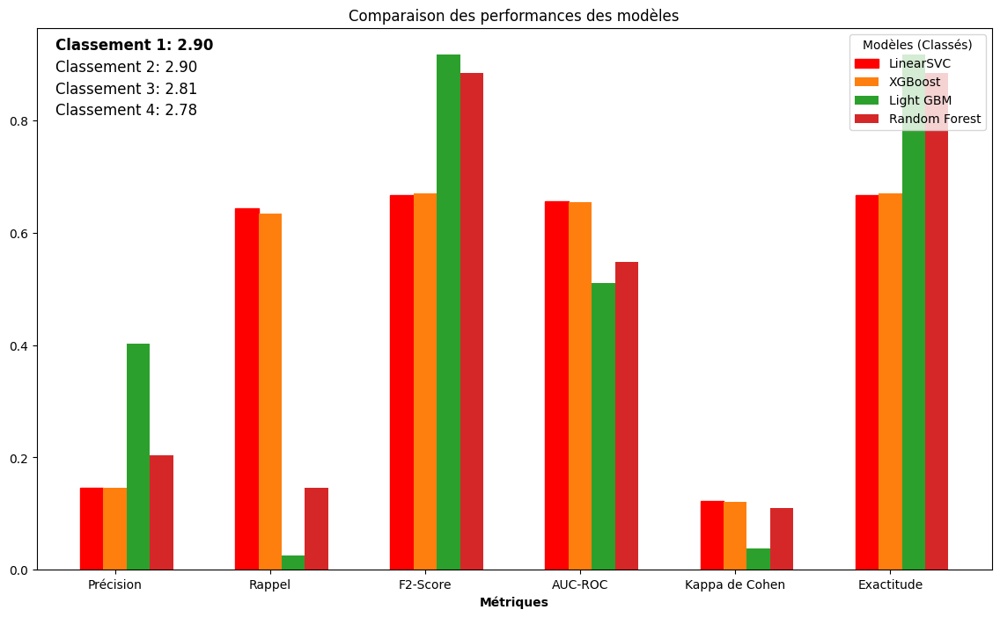

[('LinearSVC', 2.904395782159013),
 ('XGBoost', 2.8962695983544355),
 ('Light GBM', 2.8131790816590905),
 ('Random Forest', 2.77673797962436)]

In [64]:
def calculer_metrics(y_true, y_pred):
    return {
        "Précision": precision_score(y_true, y_pred),
        "Rappel": recall_score(y_true, y_pred),
        "F2-Score": fbeta_score(y_true, y_pred, beta=2, average='micro'), 
        "AUC-ROC": roc_auc_score(y_true, y_pred),
        "Kappa de Cohen": cohen_kappa_score(y_true, y_pred),  # Inclus Cohen's Kappa
        "Exactitude": accuracy_score(y_true, y_pred)
    }

# Générez les prédictions pour chaque modèle et calculez les métriques
metrics_svc = calculer_metrics(y_val, y_pred_svc)
metrics_rfc = calculer_metrics(y_val, y_pred_rfc)
metrics_xgb = calculer_metrics(y_val, y_pred_xgb)
metrics_lgb = calculer_metrics(y_val, y_pred_lgb)

# Créez un dictionnaire pour stocker toutes les métriques pour chaque modèle
toutes_les_metrics = {
    "LinearSVC": metrics_svc,
    "Random Forest": metrics_rfc,
    "XGBoost": metrics_xgb,
    "Light GBM": metrics_lgb
}

# Calculez la somme de toutes les métriques pour chaque modèle pour le classement
somme_metrics = {modele: sum(metrics.values()) for modele, metrics in toutes_les_metrics.items()}
modeles_tries = sorted(somme_metrics.items(), key=lambda x: x[1], reverse=True)

# Noms des modèles
noms_modeles = [modele for modele, _ in modeles_tries]

# Noms des métriques
noms_metrics = list(toutes_les_metrics[noms_modeles[0]].keys())

# Créez une matrice pour stocker les valeurs de métriques pour chaque modèle
matrice_metrics = np.array([[toutes_les_metrics[modele][metric] for metric in noms_metrics] for modele in noms_modeles])

# Créez le graphique
fig, ax = plt.subplots(figsize=(14, 8))

# Largeur de chaque barre
largeur_barre = 0.15

# Position des barres sur l'axe X
r = np.arange(len(noms_metrics))

# Ajoutez les barres
for i in range(len(noms_modeles)):
    barres = plt.bar(r + largeur_barre * i, matrice_metrics[i, :], width=largeur_barre, label=noms_modeles[i])
    # Mettez en évidence le modèle le mieux classé
    if i == 0:
        for barre in barres:
            barre.set_color('r')

# Ajoutez des étiquettes pour l'axe X
plt.xlabel('Métriques', fontweight='bold')
plt.xticks([r + largeur_barre for r in range(len(noms_metrics))], noms_metrics)

# Ajoutez une légende
plt.legend(title='Modèles (Classés)', loc='upper right')

# Ajoutez un titre
plt.title('Comparaison des performances des modèles')

# Annotation avec le classement
for i, (modele, total) in enumerate(modeles_tries):
    plt.annotate(f'Classement {i+1}: {total:.2f}', 
                 xy=(0.02, 0.96 - i*0.04), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 fontweight='bold' if i == 0 else 'normal')

# Affichez le graphique
plt.show()

# Affichez les modèles triés et leurs scores totaux pour référence
modeles_tries


### Feature importance des différents modèles 

In [65]:
# definir les modeles basés sur des arbres probabilistes
tree_models = [
    {"name": 'LGBM', "model": lgb.LGBMClassifier(n_estimators=500, max_depth=8, learning_rate
                                                 =0.02, class_weight='balanced')},
    {"name": 'Random Forest', "model": RandomForestClassifier(n_estimators=200, max_features='log2', max_depth=9, criterion='entropy', class_weight='balanced')},
    {"name": 'XGBoost', "model": XGBClassifier(n_estimators=500, max_features='sqrt', max_depth=7, criterion='gini', class_weight='balanced')}
]


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 19863, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2261
[LightGBM] [Info] Number of data points in the train set: 246006, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


[15:26:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "class_weight", "criterion", "max_features" } are not used.



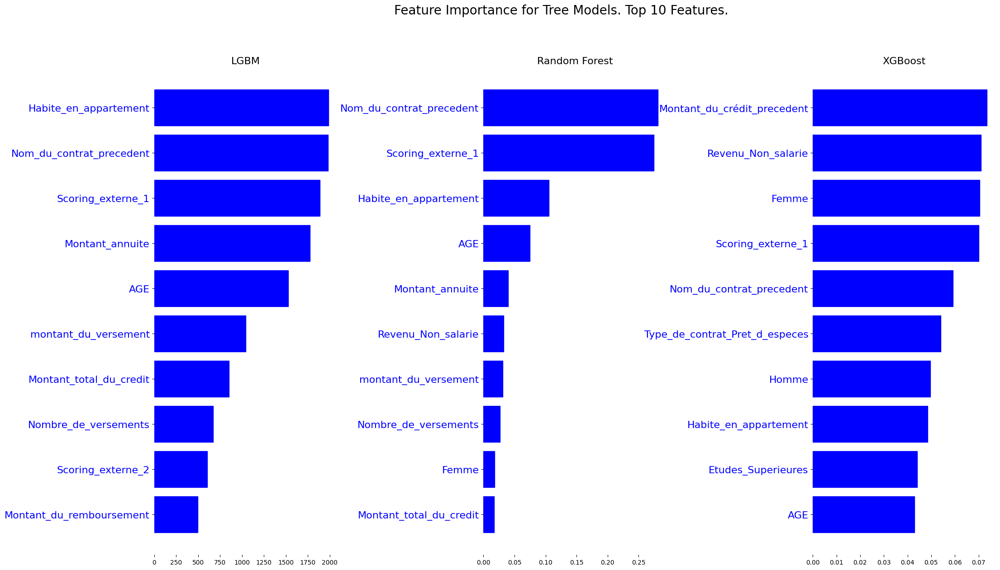

In [67]:
# List of real feature names
feature_names = ['Nombre_d_enfants', 'Montant_annuite', 'AGE',
       'Nombre_de_membres_dans_la_famille', 'Scoring_externe_2',
       'Montant_total_du_credit', 'Nombre_de_versements',
       'montant_du_versement', 'Montant_du_remboursement',
       'Montant_du_crédit_precedent', 'Type_de_contrat_Pret_d_especes',
       'Femme', 'Homme', 'Ne_possede_pas_de_vehicule', 'Possede_un_vehicule',
       'Possede_son_logement', 'Revenu_Non_salarie', 'Etudes_Superieures',
       'Marie', 'Habite_en_appartement', 'Nom_du_contrat_precedent',
       'Scoring_externe_1', 'Scoring_externe_3']

# Fit each model and get feature importances
for model_dict in tree_models:
    model = model_dict["model"]
    model.fit(X_train, y_train)
    feature_importance = model.feature_importances_
    model_dict["fi"] = feature_importance

# Plot the feature importances for each model
fig, axs = plt.subplots(1, 3, figsize=(24, 14), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace=0.5, wspace=0.8)
axs = axs.ravel()
top_x = 10  # Number of top features to show

for i in range(len(tree_models)):
    feature_importance = tree_models[i]["fi"]
    indices = np.argsort(feature_importance)
    indices = indices[-top_x:]

    bars = axs[i].barh(range(len(indices)), feature_importance[indices], color='b', align='center')
    axs[i].set_title(tree_models[i]["name"], fontweight="normal", fontsize=16)

    plt.sca(axs[i])
    plt.yticks(range(len(indices)), [feature_names[j] for j in indices], fontweight="normal", fontsize=16)

    for i, ticklabel in enumerate(plt.gca().get_yticklabels()):
        ticklabel.set_color('b')  # Use the same color for all bars in this case

    for i, bar in enumerate(bars):
        bar.set_color('b')  # Use the same color for all bars in this case
        plt.box(False)

plt.suptitle("Feature Importance for Tree Models. Top " + str(top_x) + " Features.", fontsize=20, fontweight="normal")
plt.show()

In [68]:
from collections import Counter

# Initialisez un compteur pour suivre les fréquences des caractéristiques
compteur_caracteristiques = Counter()

# Nombre de caractéristiques principales à considérer à partir de chaque modèle
top_x = 5

# Comptez les caractéristiques principales à partir de chaque modèle
for modele_dict in tree_models:
    importance_caracteristique = modele_dict["fi"]
    indices = np.argsort(importance_caracteristique)
    top_indices = indices[-top_x:]
    top_caracteristiques = [noms_caracteristiques[i] for i in top_indices]
    compteur_caracteristiques.update(top_caracteristiques)

# Obtenez les 5 caractéristiques les plus courantes parmi tous les modèles
caracteristiques_plus_communes = compteur_caracteristiques.most_common(5)

# Affichez les 5 caractéristiques les plus courantes dans l'ordre décroissant
print("Les 5 caractéristiques les plus communes par ordre décroissant sont :")
for caracteristique, compte in caracteristiques_plus_communes:
    print(f"{caracteristique} : {compte} fois")


Les 5 caractéristiques les plus communes par ordre décroissant sont :
Scoring_externe_1 : 3 fois
Nom_du_contrat_precedent : 3 fois
AGE : 2 fois
Montant_annuite : 2 fois
Habite_en_appartement : 2 fois


Observations :
LinearSVC: Ce modèle a un rappel élevé mais une précision très faible. Cela signifie qu'il est bon pour identifier les vrais positifs mais génère beaucoup de faux positifs. Le score F2, qui donne plus de poids au rappel, est également le plus bas parmi les modèles.
Random Forest: Ce modèle a une précision et un rappel relativement bas, mais une excellente exactitude. Le score F2 est le plus élevé parmi les modèles, ce qui signifie qu'il équilibre bien le rappel et la précision.
XGBoost: Ce modèle a un rappel élevé mais une précision faible, similaire à LinearSVC. Son score F2 est également bas.
Light GBM: Ce modèle a une excellente précision mais un très faible rappel. Son score F2 est le plus élevé, indiquant un bon équilibre entre rappel et précision.


L'exactitude est la plus importante, Random Forest et Light GBM sont les meilleurs. Pour une raison de poids de modèle, je choisis Light GBM


### Sauvegarde des dataframe

In [69]:
# Sauvegarder les DataFrames X_train et X_val dans des fichiers CSV
X_train.to_csv('/Users/xparisot/Formation_OpenClassRoom/Projets/Projet_7/datasets/X_train.csv', index=False)
X_val.to_csv('/Users/xparisot/Formation_OpenClassRoom/Projets/Projet_7/datasets/X_val.csv', index=False)

# Convertir les Series y_train et y_val en DataFrames
y_train_df = y_train.to_frame()
y_val_df = y_val.to_frame()

# Sauvegarder les DataFrames y_train et y_val dans des fichiers CSV
y_train_df.to_csv('/Users/xparisot/Formation_OpenClassRoom/Projets/Projet_7/datasets/y_train.csv', index=False)
y_val_df.to_csv('/Users/xparisot/Formation_OpenClassRoom/Projets/Projet_7/datasets/y_val.csv', index=False)


### Sauvegarde des modeles

In [70]:
import joblib

# Spécifier le chemin complet pour le fichier de sauvegarde du modèle SVM
svm_model_path = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/svm_model.joblib'

# Sauvegarder le modèle SVM entraîné
joblib.dump(gs_svc.best_estimator_, svm_model_path)


['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/svm_model.joblib']

In [71]:
import joblib

# Spécifier le chemin complet pour le fichier de sauvegarde du modèle Random Forest
rf_model_path = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/random_forest_model.joblib'

# Sauvegarder le modèle Random Forest entraîné
joblib.dump(gs_rfc.best_estimator_, rf_model_path)


['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/random_forest_model.joblib']

In [72]:
import joblib

# Spécifier le chemin complet pour le fichier de sauvegarde du modèle XGBoost
xgb_model_path = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/xgboost_model.joblib'

# Sauvegarder le modèle XGBoost entraîné
joblib.dump(gs_xgb.best_estimator_, xgb_model_path)


['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/xgboost_model.joblib']

In [73]:
import joblib

# Spécifier le chemin complet pour le fichier de sauvegarde du modèle LightGBM
lgb_model_path = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model.joblib'

# Sauvegarder le modèle LightGBM entraîné
joblib.dump(gs_lgb.best_estimator_, lgb_model_path)


['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model.joblib']

### Sauvegarde du modele candidat pré-entrainé

In [74]:
# Modèle pré-entraîné
model = lgb.LGBMClassifier(**gs_lgb.best_params_) 

# Chemin complet pour enregistrer le modèle
chemin_fichier_modele = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model_pretrained.joblib'

# Enregistrement du modèle dans le fichier spécifié
joblib.dump(model, chemin_fichier_modele)


['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model_pretrained.joblib']

# SPECIFICITE METIER

Le déséquilibre entre le nombre de bons et de moins bons clients doit être pris en compte pour élaborer un modèle pertinent, à l’aide d’au moins une méthode au choix


Le déséquilibre du coût métier entre un faux négatif (FN - mauvais client prédit bon client : donc crédit accordé et perte en capital) et un faux positif (FP - bon client prédit mauvais : donc refus crédit et manque à gagner en marge)


Vous pourrez supposer, par exemple, que le coût d’un FN est dix fois supérieur au coût d’un FP


Vous créerez un score “métier” (minimisation du coût d’erreur de prédiction des FN et FP) pour comparer les modèles, afin de choisir le meilleur modèle et ses meilleurs hyperparamètres. Attention cette minimisation du coût métier doit passer par l’optimisation du seuil qui détermine, à partir d’une probabilité, la classe 0 ou 1 (un “predict” suppose un seuil à 0.5 qui n’est pas forcément l’optimum)


En parallèle, maintenez pour comparaison et contrôle des mesures plus techniques, telles que l’AUC et l’accuracy 

Nous utiliserons make_scorer de Sklearn afin de calculer le coût des erreurs de prédiction (donc les FN et FP). Nous chercherons à optimiser les modeles le cas échéant.

Le score métier sera de type 5*FN + FP (où FN = nombre de FN dans la matrice de confusion pour un seuil donné, FP = nombre de FP) et de trouver son minimum pour un seuil donné

## Comment fonctionne la notation de crédit des banques 

Afin d'explique les feature external source voici une explication extraite de Finch (agence de notation)

Trois agences mondiales de notation de crédit (Moody's, Fitch Ratings et S&P Global Ratings) évaluent les banques et autres institutions financières en fonction de leur qualité, de leur fiabilité et du risque de défaut sur leurs obligations. Les échelles utilisées par chacune de ces agences sont légèrement différentes, mais elles sont généralement équivalentes.

<table>
  <tr>
    <th>MOODY'S</th>
    <th>FITCH</th>
    <th>S&P</th>
    <th>SIGNIFICATION</th>
  </tr>
  <tr>
    <td>Aaa</td>
    <td>AAA</td>
    <td>AAA</td>
    <td>Qualité la plus élevée, risque le plus faible</td>
  </tr>
  <tr>
    <td>Aa</td>
    <td>AA</td>
    <td>AA</td>
    <td>Haute qualité, risque faible</td>
  </tr>
  <tr>
    <td>A</td>
    <td>A</td>
    <td>A</td>
    <td>Qualité supérieure-moyenne, risque faible</td>
  </tr>
  <tr>
    <td>Baa</td>
    <td>BBB</td>
    <td>BBB</td>
    <td>Qualité moyenne, risque modéré</td>
  </tr>
  <tr>
    <td>Ba</td>
    <td>BB</td>
    <td>BB</td>
    <td>Qualité spéculative, risque substantiel</td>
  </tr>
  <tr>
    <td>B</td>
    <td>B</td>
    <td>B</td>
    <td>Qualité spéculative, risque élevé</td>
  </tr>
  <tr>
    <td>Caa</td>
    <td>CCC</td>
    <td>CCC</td>
    <td>Faible qualité, risque très élevé</td>
  </tr>
  <tr>
    <td>Ca</td>
    <td>CC</td>
    <td>CC</td>
    <td>En défaut ou proche du défaut, possibilité de récupération</td>
  </tr>
  <tr>
    <td></td>
    <td>C</td>
    <td>C</td>
    <td>En défaut, faible chance de récupération, peut toujours honorer les obligations</td>
  </tr>
  <tr>
    <td>C</td>
    <td>D</td>
    <td>D</td>
    <td>A fait défaut sur ses obligations, probablement continuera à le faire</td>
  </tr>
</table>

Ce tableau présente les notations de crédit données par chaque agence et leurs significations respectives en fonction de la solvabilité et du niveau de risque des institutions notées. Ces données peuvent être numérisée pour ëtre utilisées dans des analyses quantitatives et des modèles statistiques. Pour cela, on attribue généralement des valeurs numériques à chaque notation en fonction de leur niveau de risque.

Une façon courante de numériser ces notations est d'utiliser une échelle de notation numérique où les notations les plus élevées sont associées à des valeurs numériques faibles (indiquant un faible risque), et les notations les plus basses sont associées à des valeurs numériques élevées (indiquant un risque plus élevé).

Par exemple, on peut utiliser l'échelle suivante :

* Aaa/AAA : 1
* Aa/AA : 2
* A/A : 3
* Baa/BBB : 4
* Ba/BB : 5
* B/B : 6
* Caa/CCC : 7
* Ca/CC : 8
* C/C : 9
* C/D : 10

En utilisant cette échelle de notation numérique, on peut effectuer des calculs et des analyses sur les notations de crédit des banques, telles que le calcul de la moyenne des notations, l'évaluation des risques agrégés, ou l'utilisation des notations comme variable explicative dans des modèles statistiques.

Cependant, il est important de noter que la numérisation des notations de crédit est une simplification du processus réel de notation, qui est plus complexe et tient compte de nombreux facteurs. La numérisation est utile pour les analyses quantitatives, mais elle ne capture pas toute la richesse d'information contenue dans les notations de crédit, et elle ne doit pas être utilisée comme substitut complet à une évaluation approfondie du risque de crédit. Le score utilisé par les banques ne repose donc pas à 100 % sur la notation de credit. 

Nous pouvons supposer que les features EXT_SOURCE_X sont les scores pondérés emmanent des agences de notation. 

In [75]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, fbeta_score, roc_curve, roc_auc_score, accuracy_score
import lightgbm as lgb
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score

from sklearn.metrics import confusion_matrix


Notre consigne est exlicite : "Vous pourrez supposer, par exemple, que le coût d’un FN est dix fois supérieur au coût d’un FP". 
Après avoir fait plusieurs test, j'ai décidé de diminuer le coût à 5, car le X est calculé à 1.

In [76]:
# Definition d'une fonction pour le calcul du Custom_score
def custom_score(y_true, y_pred):
    conf_mat = confusion_matrix(y_true, y_pred)
    FN = conf_mat[1, 0]
    FP = conf_mat[0, 1]
    score = (5 * FN + FP) / FN
    return score

## Création du pipeline de prédiction

In [78]:
import mlflow
import joblib
import os

# Suivi du modèle ajusté avec le poids de classe basé sur le score personnalisé dans MLflow.

os.environ['MLFLOW_TRACKING_USERNAME'] = 'name'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'pass'

# Initialize MLflow
mlflow.set_tracking_uri("http://127.0.0.1:5000")
mlflow.set_experiment("Projet_7_pipeline_final")

# Step 1: Calculate the custom score on training data
score_train = custom_score(y_test_real , y_pred)

# Start an MLflow run
with mlflow.start_run(run_name="LGBM_with_Custom_Score"):
    # Step 2: Use the custom score as class weights in the LGBMClassifier
    model_pipeline = Pipeline([
        ('SMOTE', SMOTE()),  # Oversample the data using SMOTE
        ('Classifier', lgb.LGBMClassifier(**gs_lgb.best_params_, class_weight={0: 1, 1: score_train}))  # Use the best parameters from the grid search and set class weights
    ])

    # Fit the model pipeline with training data
    model_pipeline.fit(X_train, y_train)
    
    # Log hyperparameters and custom score to MLflow
    mlflow.log_params(gs_lgb.best_params_)
    mlflow.log_metric("custom_score_train", score_train)

    # Save the model pipeline and the hyperparameters
    pipe_clf_params = {
        'pipeline': model_pipeline,
        'hyperparameters': gs_lgb.best_params_,
        'custom_score_train': score_train
    }

    # Path to save the model and hyperparameters
    filename = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/model_pipeline_with_params.joblib'
    
    # Save the dictionary containing the model and hyperparameters
    joblib.dump(pipe_clf_params, filename)
    
    # Log the model artifact to MLflow
    mlflow.log_artifact(filename)

    mlflow.end_run()


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 226143, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

In [79]:
# Faire les prédiction sur les données de test
y_pred = model_pipeline.predict(X_val)

[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves


In [80]:
# Calcul du F score avec beta=2
f2 = fbeta_score(y_val, y_pred, beta=2)

In [81]:
# Calcul du score AUC-ROC
y_pred_prob = model_pipeline.predict_proba(X_val)[:, 1]
roc_auc = roc_auc_score(y_val, y_pred_prob)

[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves


#### Metrics sans custom score

In [82]:
threshold = 1  # seuil par défaut
y_pred_custom = [1 if p >= threshold else 0 for p in y_pred_prob]

In [83]:
# Calcul du F2 score avec beta=2
f2_custom = fbeta_score(y_val, y_pred_custom, beta=2, average='micro')
# Calcul de l'AUC-ROC score
roc_auc_custom = roc_auc_score(y_val, y_pred_custom)
# Calcul du Accuracy score
accuracy_custom = accuracy_score(y_val, y_pred_custom)


In [84]:
print("Custom F2 Score:", f2_custom)
print("Custom AUC-ROC Score:", roc_auc_custom)
print("Custom Accuracy Score:", accuracy_custom)

Custom F2 Score: 0.9193359565542584
Custom AUC-ROC Score: 0.5
Custom Accuracy Score: 0.9193359565542584


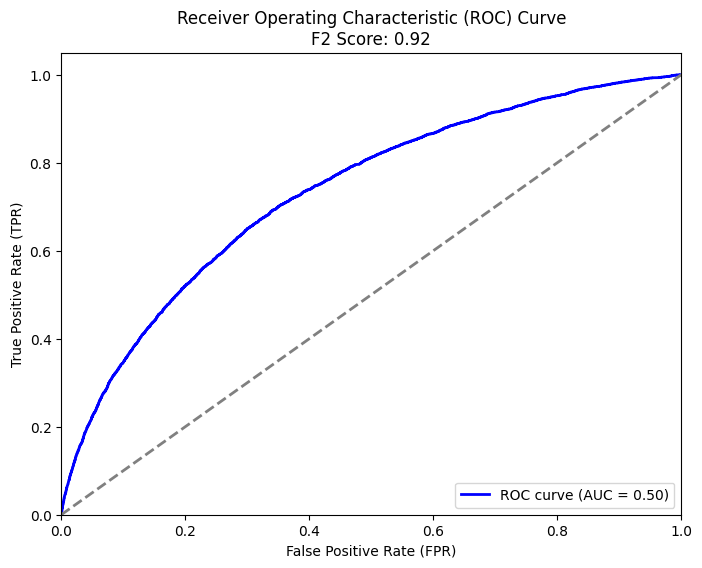

In [85]:
# dessine le ROC
fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label=f'ROC curve (AUC = {roc_auc_custom:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title(f'Receiver Operating Characteristic (ROC) Curve\nF2 Score: {f2_custom:.2f}')
plt.legend(loc='lower right')
plt.show()

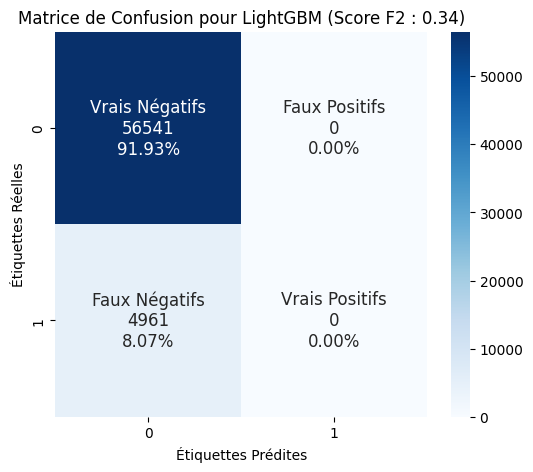

In [86]:
# Calculer et afficher la matrice de confusion pour LightGBM.
conf_mat = confusion_matrix(y_val, y_pred_custom)
group_names = ['Vrais Négatifs', 'Faux Positifs', 'Faux Négatifs', 'Vrais Positifs']
group_counts = ["{0:0.0f}".format(value) for value in conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten() / np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2, 2)

plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=labels, fmt="", cmap='Blues', annot_kws={'fontsize': 12})
plt.title(f'Matrice de Confusion pour LightGBM (Score F2 : {f2:.2f})')
plt.xlabel('Étiquettes Prédites')
plt.ylabel('Étiquettes Réelles')

# Afficher le graphique
plt.show()


#### Metrics avec custom score

In [87]:
# Calculer le score personnalisé en utilisant la validation croisée (cross-validation)
custom_scores = cross_val_score(model_pipeline, X_train, y_train, cv=5, scoring=custom_score, verbose=0)

[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 180914, number of negative: 180914
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
TypeError: custom_score() takes 2 positional arguments but 3 were given

  warnings.warn(


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 180915, number of negative: 180915
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
TypeError: custom_score() takes 2 positional arguments but 3 were given

  warnings.warn(


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 180915, number of negative: 180915
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
TypeError: custom_score() takes 2 positional arguments but 3 were given

  warnings.warn(


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 180914, number of negative: 180914
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
TypeError: custom_score() takes 2 positional arguments but 3 were given

  warnings.warn(


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 180914, number of negative: 180914
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/xparisot/anaconda3/envs/OC/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
TypeError: custom_score() takes 2 positional arguments but 3 were given

  warnings.warn(


In [88]:
# Afficher les mesures d'évaluation
print("Score Personnalisé:", np.mean(custom_scores))
print("Score F2:", f2)
print("Score AUC-ROC:", roc_auc)


Score Personnalisé: nan
Score F2: 0.33682922565984963
Score AUC-ROC: 0.7335062731448166


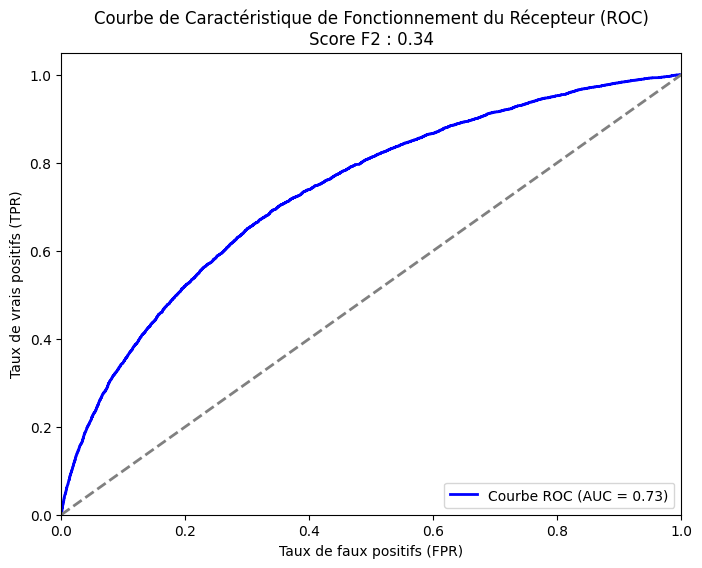

In [89]:
# Tracer la courbe ROC
fpr, tpr, thresholds = roc_curve(y_val, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label=f'Courbe ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.title(f'Courbe de Caractéristique de Fonctionnement du Récepteur (ROC)\nScore F2 : {f2:.2f}')
plt.legend(loc='lower right')
plt.show()


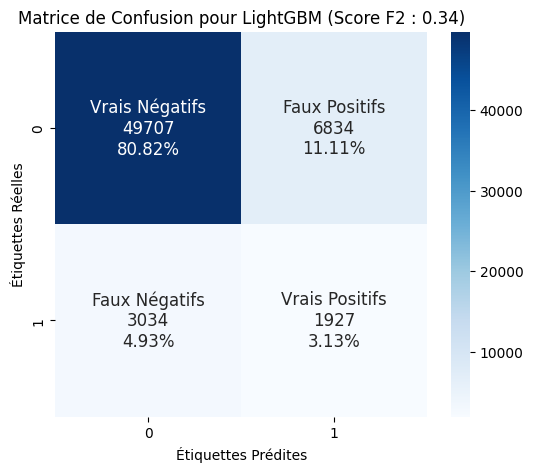

In [90]:
# Calculer et afficher la matrice de confusion pour LightGBM
conf_mat = confusion_matrix(y_val, y_pred)
group_names = ['Vrais Négatifs', 'Faux Positifs', 'Faux Négatifs', 'Vrais Positifs']
group_counts = ["{0:0.0f}".format(value) for value in conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten() / np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2, 2)

plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=labels, fmt="", cmap='Blues', annot_kws={'fontsize': 12})
plt.title(f'Matrice de Confusion pour LightGBM (Score F2 : {f2:.2f})')
plt.xlabel('Étiquettes Prédites')
plt.ylabel('Étiquettes Réelles')

# Afficher le graphique
plt.show()


## Feature importance globale

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


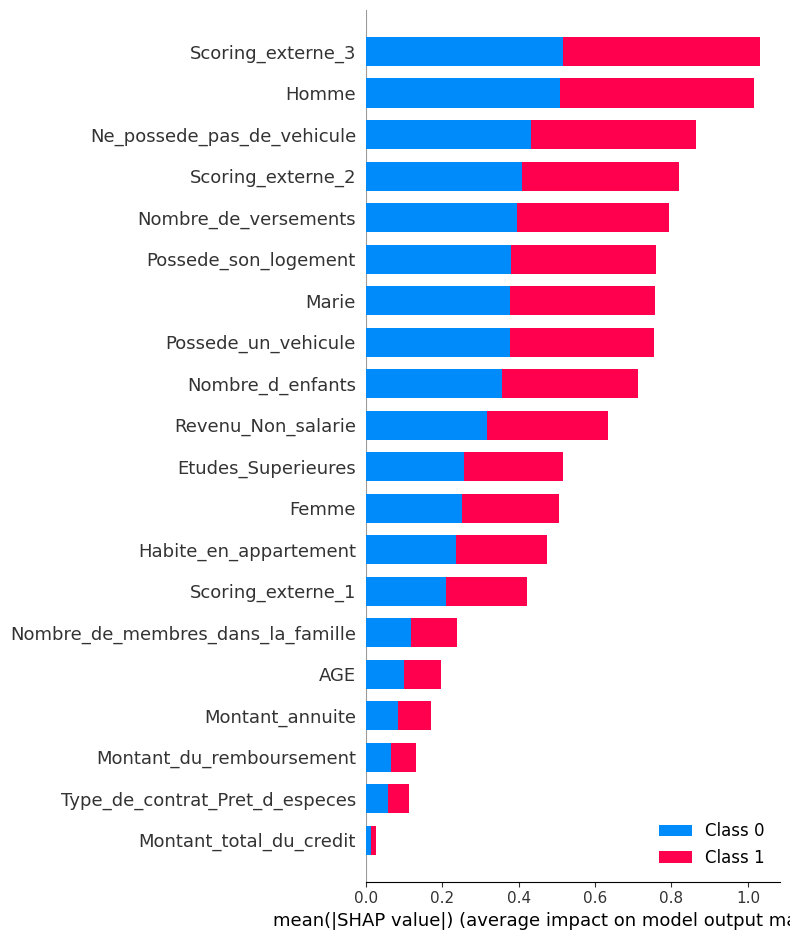

In [91]:
import shap
shap.initjs()

# Calculer les valeurs SHAP (SHapley Values)
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values = explainer.shap_values(X_val)

# Tracer le résumé des importances des caractéristiques (summary plot)
shap.summary_plot(shap_values, X_val)

# Tracer le graphique de force (force plot) pour le premier échantillon de la classe 0 (classe négative)
shap.force_plot(explainer.expected_value[0], shap_values[0][0], X_val.iloc[0])



not enough data in bin #9 for feature Nombre_de_membres_dans_la_famille, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #11 for feature Nombre_de_membres_dans_la_famille, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #12 for feature Nombre_de_membres_dans_la_famille, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #8 for feature Nombre_d_enfants, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #10 for feature Nombre_d_enfants, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #11 for feature Nombre_d_enfants, so it'll be ignored. Try increasing the number of records to plot.


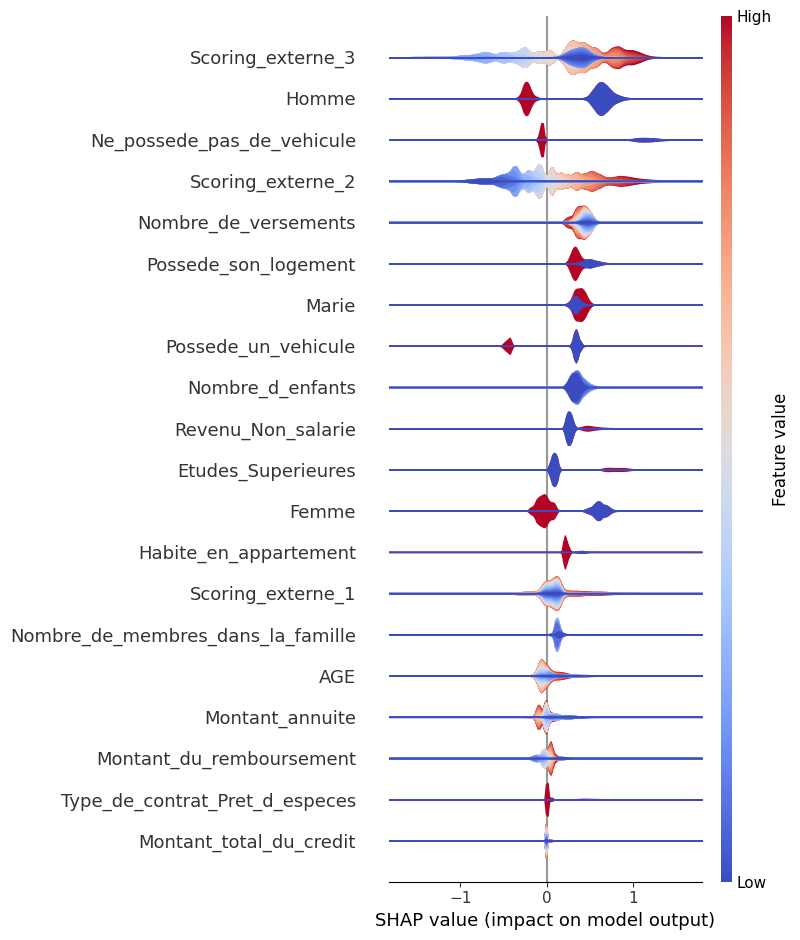

In [92]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
shap.initjs()

shap.summary_plot(shap_values[0], X_val, plot_type="layered_violin", color='coolwarm')

In [93]:
#Calcule les valeurs SHAP pour expliquer les prédictions du modèle
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values = explainer.shap_values(X_val)

# Résume les effets de toutes les caractéristiques
shap.force_plot(explainer.expected_value[0], shap_values[1][:1000,:], X_val.iloc[:1000,:])

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


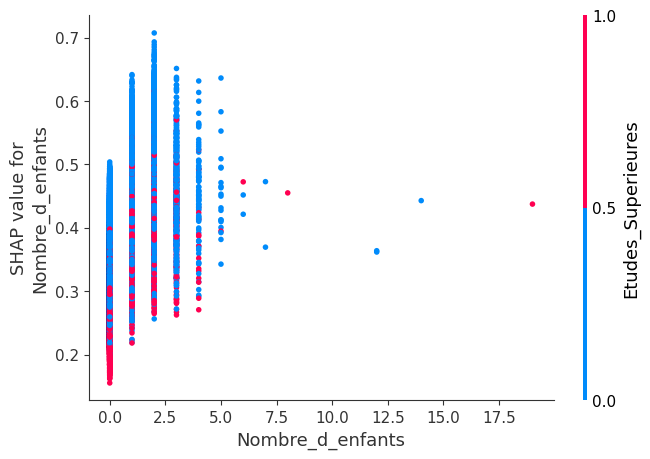

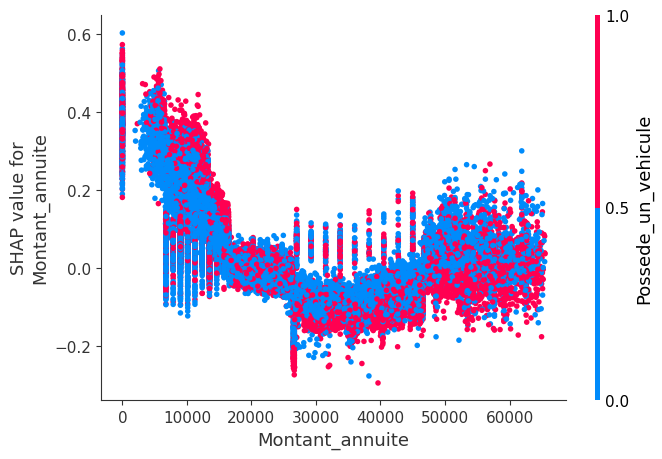

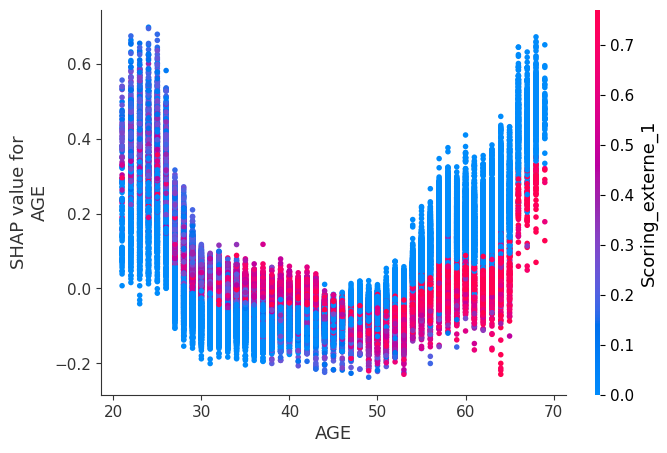

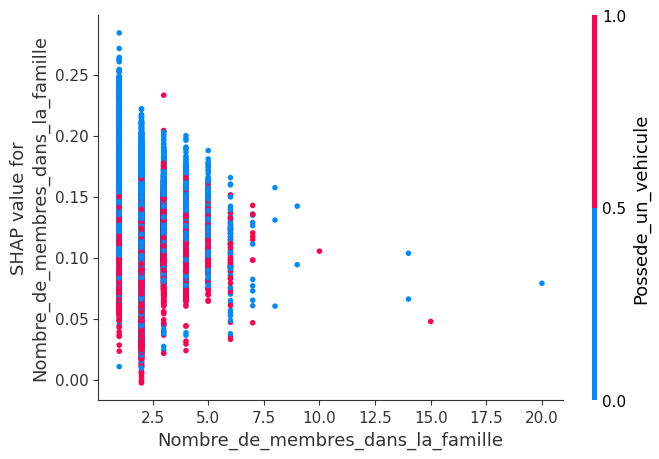

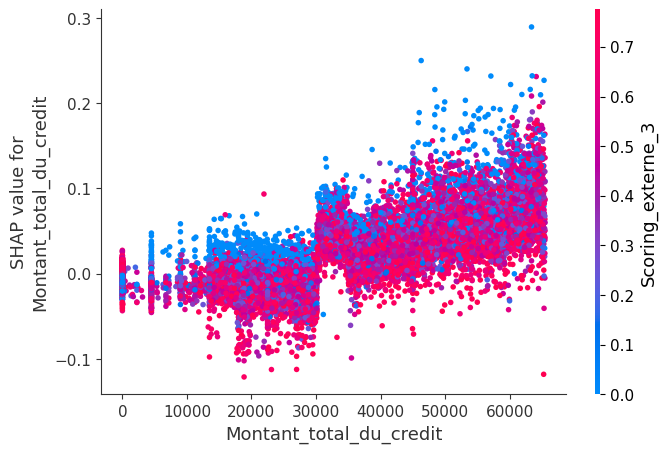

...

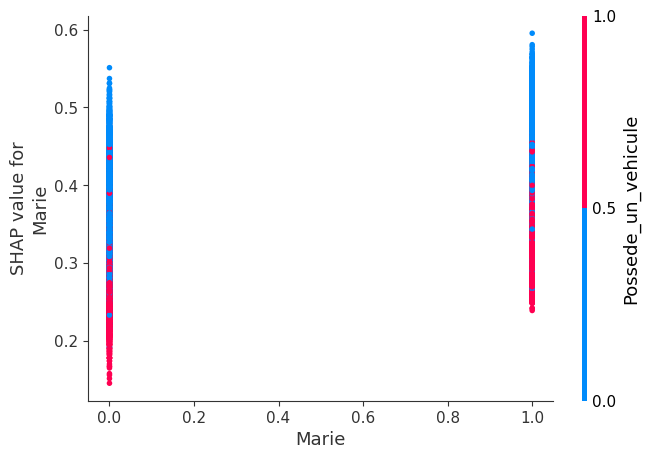

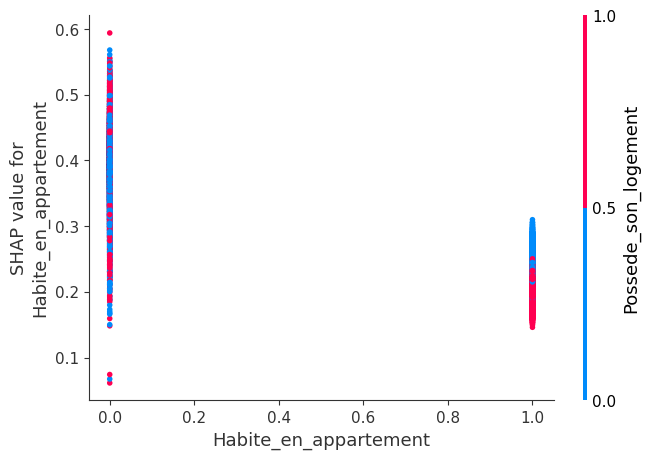

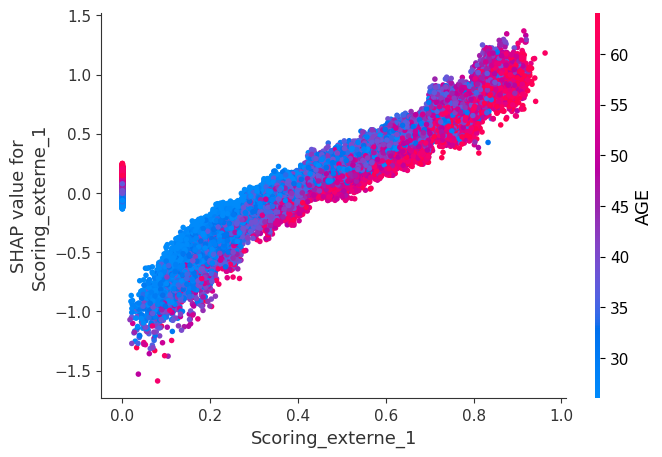

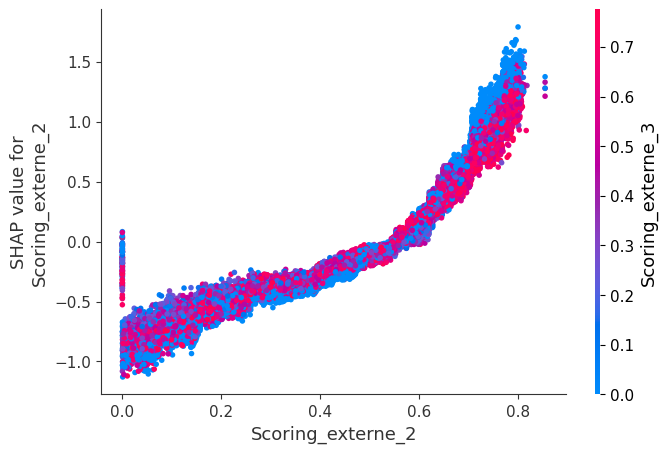

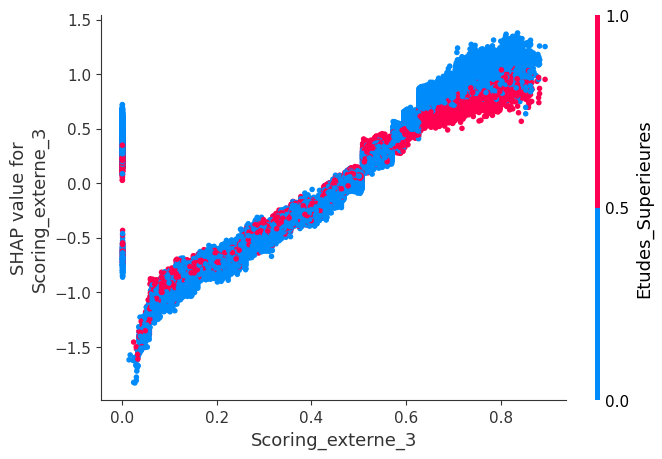

In [94]:
# Graphique de dépendance pour chaque caractéristique de la classe 0 (classe positive)
for name in X_train.columns:
    shap.dependence_plot(name, shap_values[0], X_val, display_features=X_val)

##  Feature importance en fonction de la décision 

In [95]:
# Filtrer les lignes où la feature TARGET est égale à 1
df_target_1 = df[df['TARGET'] == 1]

In [96]:
df_target_1.head(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,AMT_CREDIT_SUM,CREDIT_TYPE,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT,AMT_PAYMENT,NAME_CONTRACT_TYPE_PREV,AMT_CREDIT_PREV
0,100002,1,Cash_loans,M,N,Y,0.0,24704.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,26.0,Laborers,1.0,Business_Entity_Type_3,0.08301,0.26294,0.13940,0,40770.0,Credit_card,16.0,9250.00,9250.00,Consumer_loans,0.0
26,100031,1,Cash_loans,F,N,Y,0.0,27072.0,Working,Secondary__secondary_special,Widow,House_apartment,51.0,Cooking_staff,1.0,Business_Entity_Type_3,0.00000,0.54834,0.19067,1,0.0,Credit_card,0.0,0.00,0.00,autre,0.0
40,100047,1,Cash_loans,M,N,Y,0.0,35040.0,Commercial_associate,Secondary__secondary_special,Married,House_apartment,48.0,Laborers,2.0,Business_Entity_Type_3,0.00000,0.30688,0.32007,0,0.0,Consumer_credit,8.0,4588.00,4588.00,Revolving_loans,0.0
42,100049,1,Cash_loans,F,N,N,0.0,16256.0,Working,Secondary__secondary_special,Civil_marriage,House_apartment,37.0,Sales_staff,2.0,Self-employed,0.46826,0.67432,0.39966,1,0.0,Consumer_credit,5.0,6104.00,6104.00,Consumer_loans,41250.0
81,100096,1,Cash_loans,F,N,Y,0.0,14592.0,Pensioner,Secondary__secondary_special,Married,House_apartment,68.0,autre,2.0,XNA,0.00000,0.02396,0.72070,0,0.0,Consumer_credit,0.0,0.00,0.00,autre,0.0
94,100112,1,Cash_loans,M,Y,Y,0.0,64096.0,Commercial_associate,Incomplete_higher,Single_not_married,With_parents,28.0,autre,1.0,Industry:_type_4,0.00000,0.43237,0.07751,1,18000.0,Credit_card,2.0,20320.00,45000.00,Consumer_loans,0.0
110,100130,1,Cash_loans,F,N,Y,1.0,30800.0,Commercial_associate,Incomplete_higher,Separated,House_apartment,29.0,Sales_staff,2.0,Trade:_type_2,0.00000,0.28198,0.12067,1,0.0,Credit_card,9.0,12520.00,12520.00,Consumer_loans,0.0
138,100160,1,Cash_loans,M,N,Y,0.0,36736.0,Working,Higher_education,Married,House_apartment,46.0,Managers,2.0,Business_Entity_Type_3,0.32031,0.63184,0.28955,1,0.0,Credit_card,0.0,0.00,0.00,Consumer_loans,0.0
154,100181,1,Cash_loans,F,N,Y,0.0,12664.0,Working,Secondary__secondary_special,Single_not_married,House_apartment,48.0,Private_service_staff,1.0,Business_Entity_Type_3,0.00000,0.18213,0.44360,1,0.0,Credit_card,19.0,10664.00,10664.00,Cash_loans,0.0
163,100192,1,Cash_loans,F,N,N,0.0,21040.0,Commercial_associate,Secondary__secondary_special,Single_not_married,With_parents,22.0,Core_staff,1.0,Trade:_type_3,0.00000,0.08624,0.51367,1,0.0,Credit_card,0.0,0.00,0.00,autre,0.0


### Prédiction client rejeté

In [97]:
data.reset_index(drop=True, inplace=True)
df_wk.reset_index(drop=True, inplace=True)
df_wk['SK_ID_CURR'] = data['SK_ID_CURR']

In [98]:
# 1. Sélection du client
selected_client = 100246

# 2. Préparation des données pour la prédiction
pred = df_wk.loc[df_wk['SK_ID_CURR'] == selected_client]

# Retirer l'ID client si le modèle a été entraîné sans cette feature
if 'SK_ID_CURR' in pred.columns:
    pred = pred.drop(['SK_ID_CURR'], axis=1)

In [99]:
# 3. Prédiction et probabilité
prediction = model_pipeline.predict(pred)
prediction_proba = model_pipeline.predict_proba(pred)

[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves


In [100]:
# 4. Décision et probabilité arrondie
decision = "accordé" if prediction[0] == 0 else "refusé"
probability = round(prediction_proba[0][0] * 100)

In [101]:
# 5. Affichage des résultats
print(f'La probabilité de remboursement est de : {probability} %')
print(f'La demande de crédit est : {decision}')

La probabilité de remboursement est de : 15 %
La demande de crédit est : refusé


In [102]:
#Calculer les valeurs SHAP pour le client sélectionné
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values_selected = explainer.shap_values(pred)


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [103]:
# 3. Obtenir les valeurs des fonctionnalités pour le client sélectionné
feature_values = pd.DataFrame(pred.values, columns=pred.columns)

# Afficher le tableau des valeurs des fonctionnalités pour le client sélectionné
feature_values

,Nombre_d_enfants,Montant_annuite,AGE,Nombre_de_membres_dans_la_famille,Montant_total_du_credit,Nombre_de_versements,montant_du_versement,Montant_du_remboursement,Montant_du_crédit_precedent,Type_de_contrat_Pret_d_especes,Femme,Homme,Ne_possede_pas_de_vehicule,Possede_un_vehicule,Possede_son_logement,Revenu_Non_salarie,Etudes_Superieures,Marie,Habite_en_appartement,Scoring_externe_1,Scoring_externe_2,Scoring_externe_3
0,0.0,26992.0,35.0,2.0,0.0,1.0,11690.0,11690.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.04401,0.24316


In [104]:
# 2. Visualiser l'importance des fonctionnalités pour le client sélectionné en utilisant shap.force_plot
shap.force_plot(explainer.expected_value[0], shap_values_selected[0], feature_values)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


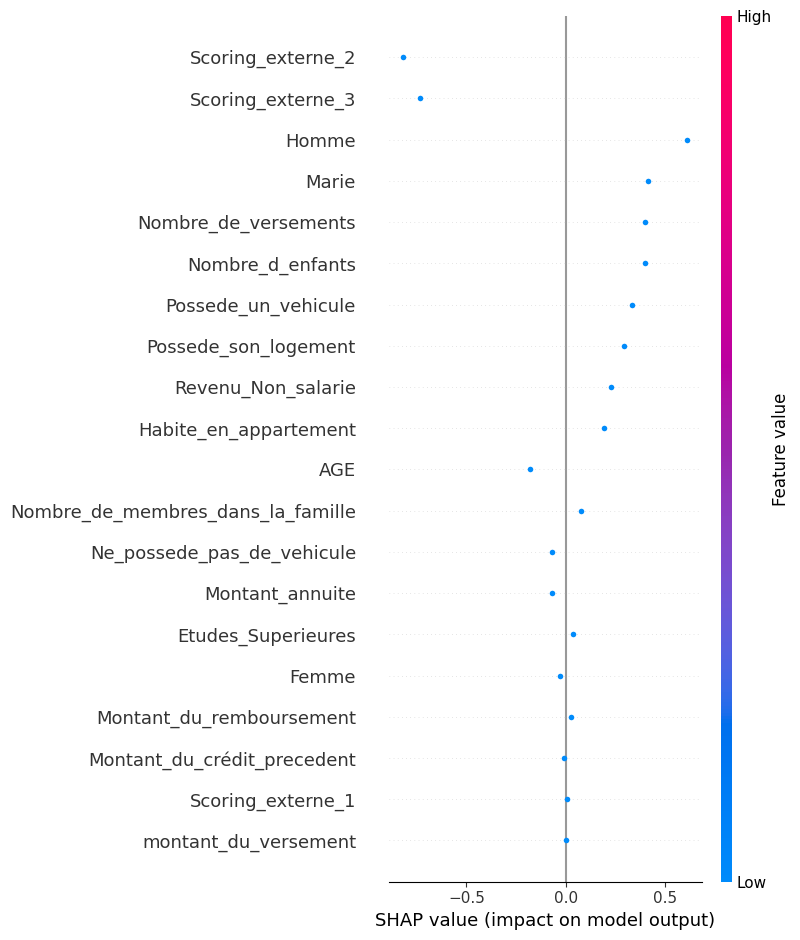

In [105]:
import shap

# Étape 1 : Calculer les valeurs SHAP pour le client sélectionné
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values_selected = explainer.shap_values(feature_values)

# Étape 2 : Visualiser l'importance des fonctionnalités pour le client sélectionné en utilisant shap.force_plot
shap.force_plot(explainer.expected_value[0], shap_values_selected[0], feature_values)

# Visualiser l'importance des fonctionnalités sous forme de graphique à barres
shap.summary_plot(shap_values_selected[0], feature_values)  # Notez l'index [0] pour sélectionner les SHAP values du client sélectionné


### Prédiction client accordé

In [106]:
data.reset_index(drop=True, inplace=True)
df_wk.reset_index(drop=True, inplace=True)
df_wk['SK_ID_CURR'] = data['SK_ID_CURR']

In [107]:
# 1. Sélection du client
selected_client = 100088

# 2. Préparation des données pour la prédiction
pred = df_wk.loc[df_wk['SK_ID_CURR'] == selected_client]

# Retirer l'ID client si le modèle a été entraîné sans cette feature
if 'SK_ID_CURR' in pred.columns:
    pred = pred.drop(['SK_ID_CURR'], axis=1)

In [108]:
# 3. Prédiction et probabilité
prediction = model_pipeline.predict(pred)
prediction_proba = model_pipeline.predict_proba(pred)

# 4. Décision et probabilité arrondie
decision = "accordé" if prediction[0] == 0 else "refusé"
probability = round(prediction_proba[0][0] * 100)

# 5. Affichage des résultats
print(f'La probabilité de remboursement est de : {probability} %')
print(f'La demande de crédit est : {decision}')

[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
La probabilité de remboursement est de : 84 %
La demande de crédit est : accordé


In [109]:
df_wk.shape 

(307508, 23)

In [110]:
# 1. Calculer les valeurs SHAP pour le client sélectionné
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values_selected = explainer.shap_values(pred)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [111]:
# 3. Obtenir les valeurs des fonctionnalités pour le client sélectionné
feature_values = pd.DataFrame(pred.values, columns=pred.columns)

# Afficher le tableau des valeurs des fonctionnalités pour le client sélectionné
feature_values

,Nombre_d_enfants,Montant_annuite,AGE,Nombre_de_membres_dans_la_famille,Montant_total_du_credit,Nombre_de_versements,montant_du_versement,Montant_du_remboursement,Montant_du_crédit_precedent,Type_de_contrat_Pret_d_especes,Femme,Homme,Ne_possede_pas_de_vehicule,Possede_un_vehicule,Possede_son_logement,Revenu_Non_salarie,Etudes_Superieures,Marie,Habite_en_appartement,Scoring_externe_1,Scoring_externe_2,Scoring_externe_3
0,0.0,6752.0,53.0,2.0,0.0,4.0,15390.0,15390.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.58496,0.40845


In [112]:
# 2. Visualiser l'importance des fonctionnalités pour le client sélectionné en utilisant shap.force_plot
shap.force_plot(explainer.expected_value[0], shap_values_selected[0], feature_values)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


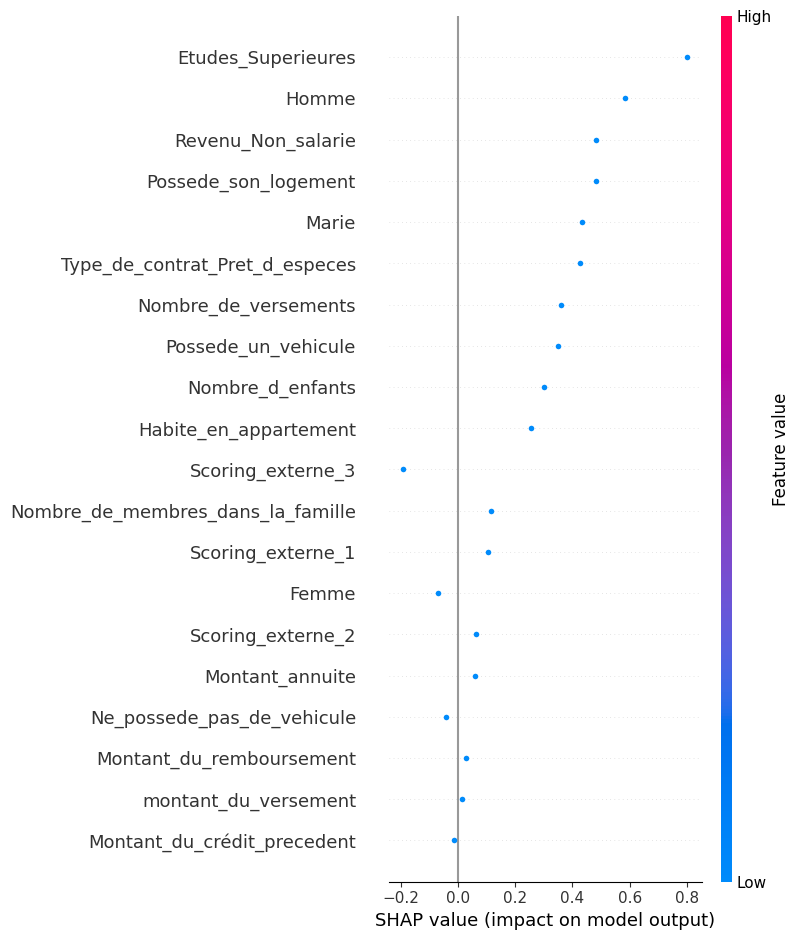

In [113]:
import shap

# Étape 1 : Calculer les valeurs SHAP pour le client sélectionné
explainer = shap.Explainer(model_pipeline.named_steps['Classifier'])
shap_values_selected = explainer.shap_values(feature_values)

# Étape 2 : Visualiser l'importance des fonctionnalités pour le client sélectionné en utilisant shap.force_plot
shap.force_plot(explainer.expected_value[0], shap_values_selected[0], feature_values)

# Visualiser l'importance des fonctionnalités sous forme de graphique à barres
shap.summary_plot(shap_values_selected[0], feature_values)  # Notez l'index [0] pour sélectionner les SHAP values du client sélectionné

### Sauvegarde du modèle

In [114]:
import joblib

# Spécifier le chemin complet pour le fichier de sauvegarde du modèle LightGBM
lgb_model_path = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model_final.joblib'

# Sauvegarder le modèle LightGBM entraîné
joblib.dump(gs_lgb.best_estimator_, lgb_model_path)

['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/lightgbm_model_final.joblib']

### Sauvegarde du jeu de données

In [115]:
df_wk.dtypes


Nombre_d_enfants                     float32
Montant_annuite                      float32
AGE                                  float32
Nombre_de_membres_dans_la_famille    float32
Montant_total_du_credit              float32
Nombre_de_versements                 float32
montant_du_versement                 float32
Montant_du_remboursement             float32
Montant_du_crédit_precedent          float32
Type_de_contrat_Pret_d_especes       float64
Femme                                float64
Homme                                float64
Ne_possede_pas_de_vehicule           float64
Possede_un_vehicule                  float64
Possede_son_logement                 float64
Revenu_Non_salarie                   float64
Etudes_Superieures                   float64
Marie                                float64
Habite_en_appartement                float64
Scoring_externe_1                    float32
Scoring_externe_2                    float32
Scoring_externe_3                    float32
SK_ID_CURR

In [116]:
import numpy as np

columns_to_convert = [
    'Type_de_contrat_Pret_d_especes',
    'Femme',
    'Homme',
    'Ne_possede_pas_de_vehicule',
    'Possede_un_vehicule',
    'Possede_son_logement',
    'Revenu_Non_salarie',
    'Etudes_Superieures',
    'Marie',
    'Habite_en_appartement',
]

# Convertir les colonnes en float16
for column in columns_to_convert:
    df_wk[column] = df_wk[column].astype(np.float16)


In [117]:
df_wk.dtypes

Nombre_d_enfants                     float32
Montant_annuite                      float32
AGE                                  float32
Nombre_de_membres_dans_la_famille    float32
Montant_total_du_credit              float32
Nombre_de_versements                 float32
montant_du_versement                 float32
Montant_du_remboursement             float32
Montant_du_crédit_precedent          float32
Type_de_contrat_Pret_d_especes       float16
Femme                                float16
Homme                                float16
Ne_possede_pas_de_vehicule           float16
Possede_un_vehicule                  float16
Possede_son_logement                 float16
Revenu_Non_salarie                   float16
Etudes_Superieures                   float16
Marie                                float16
Habite_en_appartement                float16
Scoring_externe_1                    float32
Scoring_externe_2                    float32
Scoring_externe_3                    float32
SK_ID_CURR

In [118]:
# Sauvegarder le DataFrame au format csv
df_wk.to_csv('/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/datasets/df_wk.csv', index=False)


### Sérialisation du pipeline

In [119]:
import joblib

# Step 1: Calculer le custom_score sur les données d'entrainement
score_train = custom_score(y_test_real , y_pred)

# Step 2: Use the custom score as class weights in the LGBMClassifier
model_pipeline = Pipeline([
    ('SMOTE', SMOTE()),  # Oversample the data using SMOTE
    ('Classifier', lgb.LGBMClassifier(**gs_lgb.best_params_, class_weight={0: 1, 1: score_train}))  # Use the best parameters from the grid search and set class weights
])

# Fit the model pipeline with training data
model_pipeline.fit(X_train, y_train)

# Save the model pipeline and the hyperparameters
pipe_clf_params = {
    'pipeline': model_pipeline,
    'hyperparameters': gs_lgb.best_params_,
    'custom_score_train': score_train
}

# Chemin du fichier pour sauvegarder le modèle et les hyperparamètres
model_pipeline = '/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/model_pipeline_with_params.joblib'

# Sauvegardez le dictionnaire contenant le modèle et les hyperparamètres
joblib.dump(pipe_clf_params, model_pipeline)


[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__learning_rate
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_iterations
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__max_depth
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__min_data_in_leaf
[LightGBM] [Warning] Unknown parameter: lgbmclassifier__num_leaves
[LightGBM] [Info] Number of positive: 226143, number of negative: 226143
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

['/Users/xparisot/Formation_OpenClassroom/Projets/Projet_7/models/model_pipeline_with_params.joblib']